##  Packages

In [6]:
using DynamicalSystems, CairoMakie,  DifferentialEquations, OrdinaryDiffEq

In [7]:
using StaticArrays

In [8]:
function sigma(x)
    return @fastmath 1.0 / ( 1.0 + exp( -10.0 * ( x  - ( - 0.25 ) ) ) )
end

function HR(u, p, t)
        
    a, b, c, d, s, xr, r,  I, vs, k1, k2, el_link  = p
    x1, y1, z1, x2, y2, z2 = u
    
    du1 = y1 + b * x1 ^ 2 - a * x1 ^3 - z1 + I - k1 * ( x1 - vs ) * sigma(x2) + el_link * ( x2 - x1 )
    du2 = c - d * x1 ^2 - y1
    du3 = r * ( s * ( x1 - xr ) - z1 )
    
    du4 = y2 + b * x2 ^ 2 - a * x2 ^3 - z2 + I - k2 * ( x2 - vs ) * sigma(x1) + el_link * ( x1 - x2 )
    du5 = c - d * x2 ^2 - y2
    du6 = r * ( s * ( x2 - xr ) - z2 )
    return SVector(du1, du2, du3,
                    du4, du5, du6)
end

HR (generic function with 1 method)

In [9]:
a = 1.; b = 3.; c = 1.; d = 5.;
xr = -1.6; r = 0.01; s = 5.; I = 4.; xv = 2.;

k1= -0.17; k2 = -0.17;
el_link = 0.0

condition1 = SA[-1.5, 0.0, 0.0, -2.5, 0.0, 0.0]
condition2 = SA[-0.5, -0.5, -0.5, -0.5, 0-0.5, -0.5]

p = SA[a, b, c, d,
        s, xr, r, I, xv, k1, k2,  el_link]


p = [a, b, c, d, s, xr, r, I, xv, k1, k2,  el_link]
ds_HR1 = ContinuousDynamicalSystem(HR,  condition1, p )
ds_HR2 = ContinuousDynamicalSystem(HR,  condition2, p );
ds_HR1

6-dimensional continuous dynamical system
 state:       [-1.5, 0.0, 0.0, -2.5, 0.0, 0.0]
 rule f:      HR
 in-place?    false
 jacobian:    ForwardDiff
 parameters:  [1.0, 3.0, 1.0, 5.0, 5.0, -1.6, …, 4.0, 2.0, -0.17, -0.17, 0.0]

In [10]:
ds_HR2

6-dimensional continuous dynamical system
 state:       [-0.5, -0.5, -0.5, -0.5, -0.5, -0.5]
 rule f:      HR
 in-place?    false
 jacobian:    ForwardDiff
 parameters:  [1.0, 3.0, 1.0, 5.0, 5.0, -1.6, …, 4.0, 2.0, -0.17, -0.17, 0.0]

In [34]:
tr = trajectory(ds_HR1, 100000, diffeq = (alg = AutoVern9(Rodas5()),
                                                            abstol = 1e-11, reltol = 1e-11,
                                                            maxiters = 10000000
                                                            ))

xsum = tr[:, 1] + tr[:, 4]
xsum = xsum[floor(Int, length(xsum) / 2):end ];
x1 = tr[:, 1]
y1 = tr[:, 2]
z1 = tr[:, 3];
x1 = x1[floor(Int, length(x1) / 2):end ];
y1 = y1[floor(Int, length(y1) / 2):end ];
z1 = z1[floor(Int, length(z1) / 2):end ];

In [35]:
tr1 = trajectory(ds_HR2, 100000, diffeq = (alg = AutoVern9(Rodas5()),
                                                            abstol = 1e-11, reltol = 1e-11,
                                                            maxiters = 10000000
                                                            ))

# xsum1 = tr1[:, 1] + tr1[:, 4]
# xsum1 = xsum1[floor(Int, length(xsum1) / 2):end ];
x11 = tr1[:, 1]
y11 = tr1[:, 2]
z11 = tr1[:, 3];
x11 = x11[floor(Int, length(x11) / 2):end ];
y11 = y11[floor(Int, length(y11) / 2):end ];
z11 = z11[floor(Int, length(z11) / 2):end ];

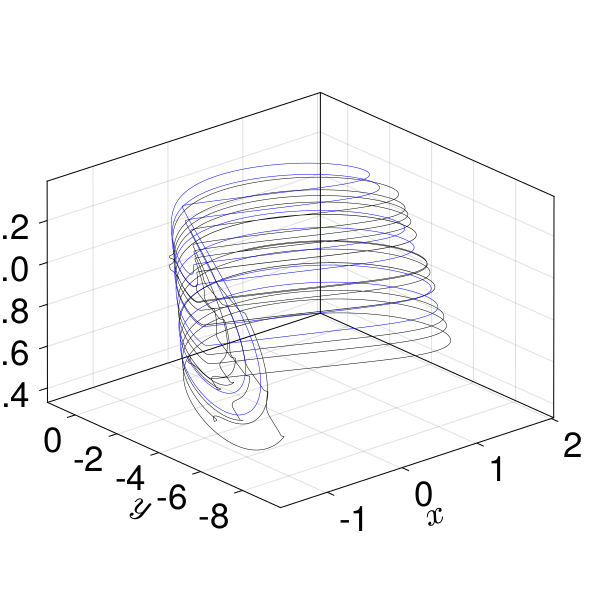

In [40]:
f = Figure(resolution = (600, 600), fontsize = 35)
ax = Axis3(f[1, 1], xlabel = L"x", ylabel = L"y", zlabel = L"z")
ts, tf = 20000, 60000
lines!(ax, x1[ts:tf], y1[ts:tf], z1[ts:tf], linewidth = 0.5, color = "black" )
lines!(ax, x11[ts:tf], y11[ts:tf], z11[ts:tf], linewidth = 0.5, color = "blue" )
f

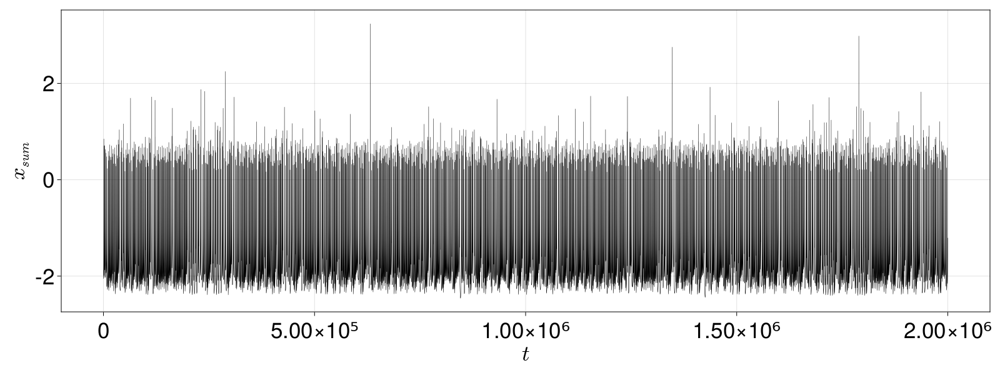

In [39]:
f = Figure(resolution = (1600, 600), fontsize = 35)
ax = Axis(f[1, 1], xlabel = L"t", ylabel = L"x_{sum}")
lines!(xsum[1:2000000], linewidth = 0.5, color = "black" )
f

In [11]:
ds = ds_HR1

pvalues = range(-0.5, stop = 0.5, length = 10000)
i = 1
plane = (2, 0.0)
tf = 1000.0
tr = 5000.0
p_index = 11

11

In [13]:
output = produce_orbitdiagram(ds, plane, i, p_index, pvalues,
                              tfinal = tf, Ttr = tr, printparams = true;
                              diffeq = (alg = AutoVern9(Rodas5()), abstol = 1e-11, reltol = 1e-11,  maxiters = 10000000)
                                );

parameter = -0.5
parameter = -0.4998999899989999
parameter = -0.4997999799979998
parameter = -0.4996999699969997
parameter = -0.4995999599959996
parameter = -0.4994999499949995
parameter = -0.4993999399939994
parameter = -0.4992999299929993
parameter = -0.4991999199919992
parameter = -0.4990999099909991
parameter = -0.498999899989999
parameter = -0.4988998899889989
parameter = -0.4987998799879988
parameter = -0.4986998699869987
parameter = -0.4985998599859986
parameter = -0.4984998499849985
parameter = -0.4983998399839984
parameter = -0.4982998299829983
parameter = -0.4981998199819982
parameter = -0.4980998099809981
parameter = -0.497999799979998
parameter = -0.4978997899789979
parameter = -0.4977997799779978
parameter = -0.4976997699769977
parameter = -0.4975997599759976
parameter = -0.4974997499749975
parameter = -0.4973997399739974
parameter = -0.4972997299729973
parameter = -0.4971997199719972
parameter = -0.4970997099709971
parameter = -0.496999699969997
parameter = -0.49689968996

parameter = -0.4741974197419742
parameter = -0.4740974097409741
parameter = -0.473997399739974
parameter = -0.4738973897389739
parameter = -0.4737973797379738
parameter = -0.4736973697369737
parameter = -0.4735973597359736
parameter = -0.4734973497349735
parameter = -0.4733973397339734
parameter = -0.4732973297329733
parameter = -0.4731973197319732
parameter = -0.4730973097309731
parameter = -0.472997299729973
parameter = -0.4728972897289729
parameter = -0.4727972797279728
parameter = -0.4726972697269727
parameter = -0.4725972597259726
parameter = -0.4724972497249725
parameter = -0.4723972397239724
parameter = -0.4722972297229723
parameter = -0.4721972197219722
parameter = -0.4720972097209721
parameter = -0.471997199719972
parameter = -0.4718971897189719
parameter = -0.4717971797179718
parameter = -0.4716971697169717
parameter = -0.4715971597159716
parameter = -0.4714971497149715
parameter = -0.4713971397139714
parameter = -0.4712971297129713
parameter = -0.4711971197119712
parameter =

parameter = -0.4484948494849485
parameter = -0.44839483948394837
parameter = -0.4482948294829483
parameter = -0.44819481948194817
parameter = -0.4480948094809481
parameter = -0.44799479947994797
parameter = -0.4478947894789479
parameter = -0.44779477947794777
parameter = -0.4476947694769477
parameter = -0.44759475947594757
parameter = -0.4474947494749475
parameter = -0.44739473947394737
parameter = -0.4472947294729473
parameter = -0.4471947194719472
parameter = -0.4470947094709471
parameter = -0.446994699469947
parameter = -0.4468946894689469
parameter = -0.4467946794679468
parameter = -0.4466946694669467
parameter = -0.4465946594659466
parameter = -0.4464946494649465
parameter = -0.4463946394639464
parameter = -0.4462946294629463
parameter = -0.4461946194619462
parameter = -0.4460946094609461
parameter = -0.445994599459946
parameter = -0.4458945894589459
parameter = -0.4457945794579458
parameter = -0.4456945694569457
parameter = -0.4455945594559456
parameter = -0.4454945494549455
para

parameter = -0.4228922892289229
parameter = -0.4227922792279228
parameter = -0.4226922692269227
parameter = -0.4225922592259226
parameter = -0.4224922492249225
parameter = -0.4223922392239224
parameter = -0.4222922292229223
parameter = -0.4221922192219222
parameter = -0.4220922092209221
parameter = -0.421992199219922
parameter = -0.4218921892189219
parameter = -0.4217921792179218
parameter = -0.4216921692169217
parameter = -0.4215921592159216
parameter = -0.4214921492149215
parameter = -0.4213921392139214
parameter = -0.4212921292129213
parameter = -0.4211921192119212
parameter = -0.4210921092109211
parameter = -0.420992099209921
parameter = -0.4208920892089209
parameter = -0.4207920792079208
parameter = -0.4206920692069207
parameter = -0.4205920592059206
parameter = -0.4204920492049205
parameter = -0.4203920392039204
parameter = -0.4202920292029203
parameter = -0.4201920192019202
parameter = -0.4200920092009201
parameter = -0.41999199919992
parameter = -0.4198919891989199
parameter = 

parameter = -0.39728972897289727
parameter = -0.3971897189718972
parameter = -0.39708970897089707
parameter = -0.396989698969897
parameter = -0.39688968896889687
parameter = -0.3967896789678968
parameter = -0.39668966896689667
parameter = -0.3965896589658966
parameter = -0.39648964896489647
parameter = -0.3963896389638964
parameter = -0.39628962896289627
parameter = -0.3961896189618962
parameter = -0.39608960896089607
parameter = -0.395989598959896
parameter = -0.39588958895889587
parameter = -0.3957895789578958
parameter = -0.39568956895689567
parameter = -0.3955895589558956
parameter = -0.39548954895489546
parameter = -0.3953895389538954
parameter = -0.39528952895289526
parameter = -0.3951895189518952
parameter = -0.39508950895089506
parameter = -0.394989498949895
parameter = -0.39488948894889486
parameter = -0.3947894789478948
parameter = -0.3946894689468947
parameter = -0.3945894589458946
parameter = -0.3944894489448945
parameter = -0.3943894389438944
parameter = -0.394289428942894

parameter = -0.3716871687168717
parameter = -0.3715871587158716
parameter = -0.3714871487148715
parameter = -0.3713871387138714
parameter = -0.3712871287128713
parameter = -0.3711871187118712
parameter = -0.3710871087108711
parameter = -0.370987098709871
parameter = -0.3708870887088709
parameter = -0.3707870787078708
parameter = -0.3706870687068707
parameter = -0.3705870587058706
parameter = -0.3704870487048705
parameter = -0.3703870387038704
parameter = -0.3702870287028703
parameter = -0.3701870187018702
parameter = -0.3700870087008701
parameter = -0.36998699869987
parameter = -0.3698869886988699
parameter = -0.3697869786978698
parameter = -0.3696869686968697
parameter = -0.3695869586958696
parameter = -0.3694869486948695
parameter = -0.3693869386938694
parameter = -0.3692869286928693
parameter = -0.3691869186918692
parameter = -0.3690869086908691
parameter = -0.368986898689869
parameter = -0.3688868886888689
parameter = -0.3687868786878688
parameter = -0.3686868686868687
parameter = 

parameter = -0.3460846084608461
parameter = -0.34598459845984597
parameter = -0.3458845884588459
parameter = -0.34578457845784577
parameter = -0.3456845684568457
parameter = -0.34558455845584557
parameter = -0.3454845484548455
parameter = -0.34538453845384537
parameter = -0.3452845284528453
parameter = -0.34518451845184517
parameter = -0.3450845084508451
parameter = -0.34498449844984497
parameter = -0.3448844884488449
parameter = -0.34478447844784477
parameter = -0.3446844684468447
parameter = -0.34458445844584457
parameter = -0.3444844484448445
parameter = -0.34438443844384437
parameter = -0.3442844284428443
parameter = -0.34418441844184416
parameter = -0.3440844084408441
parameter = -0.34398439843984396
parameter = -0.3438843884388439
parameter = -0.34378437843784376
parameter = -0.3436843684368437
parameter = -0.34358435843584356
parameter = -0.3434843484348435
parameter = -0.34338433843384336
parameter = -0.3432843284328433
parameter = -0.34318431843184316
parameter = -0.3430843084

parameter = -0.3205820582058206
parameter = -0.32048204820482046
parameter = -0.3203820382038204
parameter = -0.32028202820282026
parameter = -0.3201820182018202
parameter = -0.32008200820082006
parameter = -0.31998199819982
parameter = -0.31988198819881986
parameter = -0.3197819781978198
parameter = -0.31968196819681965
parameter = -0.3195819581958196
parameter = -0.3194819481948195
parameter = -0.3193819381938194
parameter = -0.3192819281928193
parameter = -0.3191819181918192
parameter = -0.3190819081908191
parameter = -0.318981898189819
parameter = -0.3188818881888189
parameter = -0.3187818781878188
parameter = -0.3186818681868187
parameter = -0.3185818581858186
parameter = -0.3184818481848185
parameter = -0.3183818381838184
parameter = -0.3182818281828183
parameter = -0.3181818181818182
parameter = -0.3180818081808181
parameter = -0.317981798179818
parameter = -0.3178817881788179
parameter = -0.3177817781778178
parameter = -0.3176817681768177
parameter = -0.3175817581758176
paramet

parameter = -0.294979497949795
parameter = -0.29487948794879487
parameter = -0.2947794779477948
parameter = -0.29467946794679467
parameter = -0.2945794579457946
parameter = -0.29447944794479447
parameter = -0.2943794379437944
parameter = -0.29427942794279427
parameter = -0.2941794179417942
parameter = -0.29407940794079407
parameter = -0.293979397939794
parameter = -0.29387938793879387
parameter = -0.2937793779377938
parameter = -0.29367936793679367
parameter = -0.2935793579357936
parameter = -0.29347934793479347
parameter = -0.2933793379337934
parameter = -0.29327932793279327
parameter = -0.2931793179317932
parameter = -0.29307930793079306
parameter = -0.292979297929793
parameter = -0.29287928792879286
parameter = -0.2927792779277928
parameter = -0.29267926792679266
parameter = -0.2925792579257926
parameter = -0.29247924792479246
parameter = -0.2923792379237924
parameter = -0.29227922792279226
parameter = -0.2921792179217922
parameter = -0.29207920792079206
parameter = -0.2919791979197

parameter = -0.26957695769576956
parameter = -0.2694769476947695
parameter = -0.26937693769376936
parameter = -0.2692769276927693
parameter = -0.26917691769176916
parameter = -0.2690769076907691
parameter = -0.26897689768976896
parameter = -0.2688768876887689
parameter = -0.26877687768776876
parameter = -0.2686768676867687
parameter = -0.26857685768576856
parameter = -0.2684768476847685
parameter = -0.26837683768376835
parameter = -0.2682768276827683
parameter = -0.26817681768176815
parameter = -0.2680768076807681
parameter = -0.26797679767976795
parameter = -0.2678767876787679
parameter = -0.26777677767776775
parameter = -0.2676767676767677
parameter = -0.26757675767576755
parameter = -0.2674767476747675
parameter = -0.26737673767376735
parameter = -0.2672767276727673
parameter = -0.26717671767176715
parameter = -0.2670767076707671
parameter = -0.26697669766976695
parameter = -0.2668766876687669
parameter = -0.2667766776677668
parameter = -0.2666766676667667
parameter = -0.26657665766

parameter = -0.24407440744074407
parameter = -0.24397439743974397
parameter = -0.24387438743874387
parameter = -0.24377437743774377
parameter = -0.24367436743674367
parameter = -0.24357435743574357
parameter = -0.24347434743474347
parameter = -0.24337433743374337
parameter = -0.24327432743274327
parameter = -0.24317431743174317
parameter = -0.24307430743074307
parameter = -0.24297429742974297
parameter = -0.24287428742874287
parameter = -0.24277427742774277
parameter = -0.24267426742674267
parameter = -0.24257425742574257
parameter = -0.24247424742474247
parameter = -0.24237423742374237
parameter = -0.24227422742274227
parameter = -0.24217421742174217
parameter = -0.24207420742074207
parameter = -0.24197419741974197
parameter = -0.24187418741874187
parameter = -0.24177417741774176
parameter = -0.24167416741674166
parameter = -0.24157415741574156
parameter = -0.24147414741474146
parameter = -0.24137413741374136
parameter = -0.24127412741274126
parameter = -0.24117411741174116
parameter 

parameter = -0.21917191719171916
parameter = -0.21907190719071906
parameter = -0.21897189718971896
parameter = -0.21887188718871886
parameter = -0.21877187718771876
parameter = -0.21867186718671866
parameter = -0.21857185718571856
parameter = -0.21847184718471846
parameter = -0.21837183718371836
parameter = -0.21827182718271826
parameter = -0.21817181718171816
parameter = -0.21807180718071806
parameter = -0.21797179717971799
parameter = -0.21787178717871789
parameter = -0.21777177717771778
parameter = -0.21767176717671768
parameter = -0.21757175717571758
parameter = -0.21747174717471748
parameter = -0.21737173717371738
parameter = -0.21727172717271728
parameter = -0.21717171717171718
parameter = -0.21707170717071708
parameter = -0.21697169716971698
parameter = -0.21687168716871688
parameter = -0.21677167716771678
parameter = -0.21667166716671668
parameter = -0.21657165716571658
parameter = -0.21647164716471648
parameter = -0.21637163716371638
parameter = -0.21627162716271628
parameter 

parameter = -0.19406940694069408
parameter = -0.19396939693969398
parameter = -0.19386938693869388
parameter = -0.19376937693769378
parameter = -0.19366936693669368
parameter = -0.19356935693569358
parameter = -0.19346934693469348
parameter = -0.19336933693369338
parameter = -0.19326932693269328
parameter = -0.19316931693169317
parameter = -0.19306930693069307
parameter = -0.19296929692969297
parameter = -0.19286928692869287
parameter = -0.19276927692769277
parameter = -0.19266926692669267
parameter = -0.19256925692569257
parameter = -0.19246924692469247
parameter = -0.19236923692369237
parameter = -0.19226922692269227
parameter = -0.19216921692169217
parameter = -0.19206920692069207
parameter = -0.19196919691969197
parameter = -0.19186918691869187
parameter = -0.19176917691769177
parameter = -0.19166916691669167
parameter = -0.19156915691569157
parameter = -0.19146914691469147
parameter = -0.19136913691369137
parameter = -0.19126912691269127
parameter = -0.19116911691169117
parameter 

parameter = -0.16916691669166917
parameter = -0.16906690669066907
parameter = -0.16896689668966897
parameter = -0.16886688668866887
parameter = -0.16876687668766877
parameter = -0.16866686668666866
parameter = -0.16856685668566856
parameter = -0.16846684668466846
parameter = -0.16836683668366836
parameter = -0.16826682668266826
parameter = -0.16816681668166816
parameter = -0.16806680668066806
parameter = -0.16796679667966796
parameter = -0.16786678667866786
parameter = -0.16776677667766776
parameter = -0.16766676667666766
parameter = -0.16756675667566756
parameter = -0.16746674667466746
parameter = -0.16736673667366736
parameter = -0.16726672667266726
parameter = -0.16716671667166716
parameter = -0.16706670667066706
parameter = -0.16696669666966696
parameter = -0.16686668666866686
parameter = -0.16676667666766676
parameter = -0.16666666666666666
parameter = -0.16656665666566656
parameter = -0.16646664666466646
parameter = -0.16636663666366636
parameter = -0.16626662666266626
parameter 

parameter = -0.14426442644264426
parameter = -0.14416441644164416
parameter = -0.14406440644064405
parameter = -0.14396439643964395
parameter = -0.14386438643864385
parameter = -0.14376437643764375
parameter = -0.14366436643664365
parameter = -0.14356435643564355
parameter = -0.14346434643464345
parameter = -0.14336433643364335
parameter = -0.14326432643264325
parameter = -0.14316431643164315
parameter = -0.14306430643064305
parameter = -0.14296429642964295
parameter = -0.14286428642864285
parameter = -0.14276427642764278
parameter = -0.14266426642664268
parameter = -0.14256425642564258
parameter = -0.14246424642464248
parameter = -0.14236423642364238
parameter = -0.14226422642264228
parameter = -0.14216421642164218
parameter = -0.14206420642064208
parameter = -0.14196419641964197
parameter = -0.14186418641864187
parameter = -0.14176417641764177
parameter = -0.14166416641664167
parameter = -0.14156415641564157
parameter = -0.14146414641464147
parameter = -0.14136413641364137
parameter 

parameter = -0.11926192619261926
parameter = -0.11916191619161916
parameter = -0.11906190619061906
parameter = -0.11896189618961896
parameter = -0.11886188618861886
parameter = -0.11876187618761876
parameter = -0.11866186618661866
parameter = -0.11856185618561856
parameter = -0.11846184618461846
parameter = -0.11836183618361837
parameter = -0.11826182618261827
parameter = -0.11816181618161817
parameter = -0.11806180618061807
parameter = -0.11796179617961797
parameter = -0.11786178617861787
parameter = -0.11776177617761777
parameter = -0.11766176617661767
parameter = -0.11756175617561757
parameter = -0.11746174617461747
parameter = -0.11736173617361736
parameter = -0.11726172617261726
parameter = -0.11716171617161716
parameter = -0.11706170617061706
parameter = -0.11696169616961696
parameter = -0.11686168616861686
parameter = -0.11676167616761676
parameter = -0.11666166616661666
parameter = -0.11656165616561656
parameter = -0.11646164616461646
parameter = -0.11636163616361636
parameter 

parameter = -0.09435943594359436
parameter = -0.09425942594259426
parameter = -0.09415941594159416
parameter = -0.09405940594059406
parameter = -0.09395939593959396
parameter = -0.09385938593859386
parameter = -0.09375937593759376
parameter = -0.09365936593659366
parameter = -0.09355935593559356
parameter = -0.09345934593459346
parameter = -0.09335933593359336
parameter = -0.09325932593259326
parameter = -0.09315931593159316
parameter = -0.09305930593059306
parameter = -0.09295929592959296
parameter = -0.09285928592859286
parameter = -0.09275927592759275
parameter = -0.09265926592659265
parameter = -0.09255925592559255
parameter = -0.09245924592459245
parameter = -0.09235923592359235
parameter = -0.09225922592259225
parameter = -0.09215921592159215
parameter = -0.09205920592059207
parameter = -0.09195919591959197
parameter = -0.09185918591859187
parameter = -0.09175917591759176
parameter = -0.09165916591659166
parameter = -0.09155915591559156
parameter = -0.09145914591459146
parameter 

parameter = -0.06945694569456946
parameter = -0.06935693569356936
parameter = -0.06925692569256926
parameter = -0.06915691569156916
parameter = -0.06905690569056906
parameter = -0.06895689568956896
parameter = -0.06885688568856886
parameter = -0.06875687568756876
parameter = -0.06865686568656866
parameter = -0.06855685568556856
parameter = -0.06845684568456846
parameter = -0.06835683568356836
parameter = -0.06825682568256826
parameter = -0.06815681568156816
parameter = -0.06805680568056806
parameter = -0.06795679567956796
parameter = -0.06785678567856786
parameter = -0.06775677567756776
parameter = -0.06765676567656766
parameter = -0.06755675567556756
parameter = -0.06745674567456746
parameter = -0.06735673567356736
parameter = -0.06725672567256726
parameter = -0.06715671567156715
parameter = -0.06705670567056705
parameter = -0.06695669566956695
parameter = -0.06685668566856685
parameter = -0.06675667566756675
parameter = -0.06665666566656665
parameter = -0.06655665566556655
parameter 

parameter = -0.04475447544754475
parameter = -0.04465446544654465
parameter = -0.04455445544554455
parameter = -0.04445444544454445
parameter = -0.04435443544354435
parameter = -0.04425442544254425
parameter = -0.04415441544154416
parameter = -0.04405440544054406
parameter = -0.04395439543954396
parameter = -0.04385438543854386
parameter = -0.043754375437543756
parameter = -0.043654365436543656
parameter = -0.043554355435543556
parameter = -0.043454345434543455
parameter = -0.043354335433543355
parameter = -0.043254325432543254
parameter = -0.043154315431543154
parameter = -0.043054305430543054
parameter = -0.04295429542954295
parameter = -0.04285428542854285
parameter = -0.04275427542754275
parameter = -0.04265426542654265
parameter = -0.04255425542554255
parameter = -0.04245424542454245
parameter = -0.04235423542354235
parameter = -0.04225422542254226
parameter = -0.04215421542154216
parameter = -0.04205420542054206
parameter = -0.041954195419541956
parameter = -0.041854185418541856


parameter = -0.020152015201520154
parameter = -0.020052005200520053
parameter = -0.019951995199519953
parameter = -0.019851985198519852
parameter = -0.019751975197519752
parameter = -0.01965196519651965
parameter = -0.01955195519551955
parameter = -0.01945194519451945
parameter = -0.01935193519351935
parameter = -0.019251925192519254
parameter = -0.019151915191519153
parameter = -0.019051905190519053
parameter = -0.018951895189518952
parameter = -0.018851885188518852
parameter = -0.01875187518751875
parameter = -0.01865186518651865
parameter = -0.01855185518551855
parameter = -0.01845184518451845
parameter = -0.01835183518351835
parameter = -0.018251825182518253
parameter = -0.018151815181518153
parameter = -0.018051805180518053
parameter = -0.017951795179517952
parameter = -0.017851785178517852
parameter = -0.01775177517751775
parameter = -0.01765176517651765
parameter = -0.01755175517551755
parameter = -0.01745174517451745
parameter = -0.017351735173517353
parameter = -0.017251725172

parameter = 0.00435043504350435
parameter = 0.00445044504450445
parameter = 0.004550455045504551
parameter = 0.00465046504650465
parameter = 0.004750475047504751
parameter = 0.00485048504850485
parameter = 0.0049504950495049506
parameter = 0.005050505050505051
parameter = 0.0051505150515051504
parameter = 0.005250525052505251
parameter = 0.00535053505350535
parameter = 0.005450545054505451
parameter = 0.00555055505550555
parameter = 0.005650565056505651
parameter = 0.005750575057505751
parameter = 0.0058505850585058505
parameter = 0.005950595059505951
parameter = 0.00605060506050605
parameter = 0.006150615061506151
parameter = 0.00625062506250625
parameter = 0.006350635063506351
parameter = 0.006450645064506451
parameter = 0.0065506550655065506
parameter = 0.006650665066506651
parameter = 0.0067506750675067504
parameter = 0.006850685068506851
parameter = 0.00695069506950695
parameter = 0.007050705070507051
parameter = 0.007150715071507151
parameter = 0.007250725072507251
parameter = 0.

parameter = 0.029452945294529454
parameter = 0.029552955295529554
parameter = 0.02965296529652965
parameter = 0.029752975297529752
parameter = 0.029852985298529852
parameter = 0.029952995299529953
parameter = 0.030053005300530053
parameter = 0.030153015301530153
parameter = 0.030253025302530254
parameter = 0.030353035303530354
parameter = 0.030453045304530454
parameter = 0.03055305530553055
parameter = 0.03065306530653065
parameter = 0.030753075307530752
parameter = 0.030853085308530852
parameter = 0.030953095309530953
parameter = 0.031053105310531053
parameter = 0.031153115311531154
parameter = 0.03125312531253125
parameter = 0.03135313531353135
parameter = 0.03145314531453145
parameter = 0.03155315531553155
parameter = 0.03165316531653165
parameter = 0.03175317531753175
parameter = 0.03185318531853185
parameter = 0.03195319531953195
parameter = 0.032053205320532054
parameter = 0.032153215321532154
parameter = 0.032253225322532254
parameter = 0.032353235323532355
parameter = 0.0324532

parameter = 0.05485548554855486
parameter = 0.05495549554955496
parameter = 0.05505550555055506
parameter = 0.05515551555155516
parameter = 0.05525552555255526
parameter = 0.05535553555355536
parameter = 0.05545554555455545
parameter = 0.05555555555555555
parameter = 0.05565556555655565
parameter = 0.05575557555755575
parameter = 0.055855585558555854
parameter = 0.055955595559555954
parameter = 0.056055605560556054
parameter = 0.056155615561556155
parameter = 0.056255625562556255
parameter = 0.056355635563556356
parameter = 0.056455645564556456
parameter = 0.056555655565556556
parameter = 0.05665566556655666
parameter = 0.05675567556755676
parameter = 0.05685568556855686
parameter = 0.05695569556955696
parameter = 0.05705570557055706
parameter = 0.05715571557155716
parameter = 0.05725572557255726
parameter = 0.05735573557355735
parameter = 0.05745574557455745
parameter = 0.05755575557555755
parameter = 0.057655765576557653
parameter = 0.057755775577557754
parameter = 0.0578557855785578

parameter = 0.08055805580558056
parameter = 0.08065806580658066
parameter = 0.08075807580758076
parameter = 0.08085808580858085
parameter = 0.08095809580958095
parameter = 0.08105810581058105
parameter = 0.08115811581158115
parameter = 0.08125812581258125
parameter = 0.08135813581358135
parameter = 0.08145814581458145
parameter = 0.08155815581558155
parameter = 0.08165816581658165
parameter = 0.08175817581758175
parameter = 0.08185818581858186
parameter = 0.08195819581958196
parameter = 0.08205820582058206
parameter = 0.08215821582158216
parameter = 0.08225822582258226
parameter = 0.08235823582358236
parameter = 0.08245824582458246
parameter = 0.08255825582558256
parameter = 0.08265826582658266
parameter = 0.08275827582758276
parameter = 0.08285828582858286
parameter = 0.08295829582958296
parameter = 0.08305830583058306
parameter = 0.08315831583158316
parameter = 0.08325832583258326
parameter = 0.08335833583358336
parameter = 0.08345834583458346
parameter = 0.08355835583558356
paramete

parameter = 0.10636063606360636
parameter = 0.10646064606460647
parameter = 0.10656065606560657
parameter = 0.10666066606660667
parameter = 0.10676067606760677
parameter = 0.10686068606860687
parameter = 0.10696069606960697
parameter = 0.10706070607060707
parameter = 0.10716071607160715
parameter = 0.10726072607260725
parameter = 0.10736073607360735
parameter = 0.10746074607460745
parameter = 0.10756075607560756
parameter = 0.10766076607660766
parameter = 0.10776077607760776
parameter = 0.10786078607860786
parameter = 0.10796079607960796
parameter = 0.10806080608060806
parameter = 0.10816081608160816
parameter = 0.10826082608260826
parameter = 0.10836083608360836
parameter = 0.10846084608460846
parameter = 0.10856085608560856
parameter = 0.10866086608660866
parameter = 0.10876087608760876
parameter = 0.10886088608860886
parameter = 0.10896089608960896
parameter = 0.10906090609060906
parameter = 0.10916091609160916
parameter = 0.10926092609260926
parameter = 0.10936093609360936
paramete

parameter = 0.13216321632163217
parameter = 0.13226322632263227
parameter = 0.13236323632363237
parameter = 0.13246324632463247
parameter = 0.13256325632563257
parameter = 0.13266326632663267
parameter = 0.13276327632763277
parameter = 0.13286328632863287
parameter = 0.13296329632963297
parameter = 0.13306330633063307
parameter = 0.13316331633163317
parameter = 0.13326332633263327
parameter = 0.13336333633363337
parameter = 0.13346334633463347
parameter = 0.13356335633563357
parameter = 0.13366336633663367
parameter = 0.13376337633763377
parameter = 0.13386338633863387
parameter = 0.13396339633963397
parameter = 0.13406340634063407
parameter = 0.13416341634163417
parameter = 0.13426342634263427
parameter = 0.13436343634363437
parameter = 0.13446344634463447
parameter = 0.13456345634563457
parameter = 0.13466346634663467
parameter = 0.13476347634763478
parameter = 0.13486348634863488
parameter = 0.13496349634963498
parameter = 0.13506350635063508
parameter = 0.13516351635163518
paramete

parameter = 0.15796579657965795
parameter = 0.15806580658065805
parameter = 0.15816581658165815
parameter = 0.15826582658265825
parameter = 0.15836583658365835
parameter = 0.15846584658465845
parameter = 0.15856585658565855
parameter = 0.15866586658665865
parameter = 0.15876587658765876
parameter = 0.15886588658865886
parameter = 0.15896589658965896
parameter = 0.15906590659065906
parameter = 0.15916591659165916
parameter = 0.15926592659265926
parameter = 0.15936593659365936
parameter = 0.15946594659465946
parameter = 0.15956595659565956
parameter = 0.15966596659665966
parameter = 0.15976597659765976
parameter = 0.15986598659865986
parameter = 0.15996599659965996
parameter = 0.16006600660066006
parameter = 0.16016601660166016
parameter = 0.16026602660266026
parameter = 0.16036603660366036
parameter = 0.16046604660466046
parameter = 0.16056605660566056
parameter = 0.16066606660666066
parameter = 0.16076607660766076
parameter = 0.16086608660866086
parameter = 0.16096609660966096
paramete

parameter = 0.18356835683568357
parameter = 0.18366836683668367
parameter = 0.18376837683768377
parameter = 0.18386838683868387
parameter = 0.18396839683968397
parameter = 0.18406840684068407
parameter = 0.18416841684168417
parameter = 0.18426842684268427
parameter = 0.18436843684368437
parameter = 0.18446844684468447
parameter = 0.18456845684568457
parameter = 0.18466846684668467
parameter = 0.18476847684768477
parameter = 0.18486848684868487
parameter = 0.18496849684968497
parameter = 0.18506850685068507
parameter = 0.18516851685168517
parameter = 0.18526852685268527
parameter = 0.18536853685368537
parameter = 0.18546854685468547
parameter = 0.18556855685568557
parameter = 0.18566856685668567
parameter = 0.18576857685768577
parameter = 0.18586858685868587
parameter = 0.18596859685968598
parameter = 0.18606860686068608
parameter = 0.18616861686168618
parameter = 0.18626862686268628
parameter = 0.18636863686368638
parameter = 0.18646864686468648
parameter = 0.18656865686568658
paramete

parameter = 0.20927092709270928
parameter = 0.20937093709370938
parameter = 0.20947094709470948
parameter = 0.20957095709570958
parameter = 0.20967096709670968
parameter = 0.20977097709770978
parameter = 0.20987098709870988
parameter = 0.20997099709970998
parameter = 0.21007100710071008
parameter = 0.21017101710171018
parameter = 0.21027102710271028
parameter = 0.21037103710371038
parameter = 0.21047104710471048
parameter = 0.21057105710571056
parameter = 0.21067106710671066
parameter = 0.21077107710771076
parameter = 0.21087108710871086
parameter = 0.21097109710971096
parameter = 0.21107110711071106
parameter = 0.21117111711171116
parameter = 0.21127112711271126
parameter = 0.21137113711371136
parameter = 0.21147114711471146
parameter = 0.21157115711571156
parameter = 0.21167116711671166
parameter = 0.21177117711771176
parameter = 0.21187118711871186
parameter = 0.21197119711971196
parameter = 0.21207120712071206
parameter = 0.21217121712171216
parameter = 0.21227122712271226
paramete

parameter = 0.23497349734973497
parameter = 0.23507350735073507
parameter = 0.23517351735173517
parameter = 0.23527352735273527
parameter = 0.23537353735373537
parameter = 0.23547354735473547
parameter = 0.23557355735573557
parameter = 0.23567356735673567
parameter = 0.23577357735773577
parameter = 0.23587358735873587
parameter = 0.23597359735973597
parameter = 0.23607360736073607
parameter = 0.23617361736173617
parameter = 0.23627362736273627
parameter = 0.23637363736373637
parameter = 0.23647364736473647
parameter = 0.23657365736573657
parameter = 0.23667366736673667
parameter = 0.23677367736773677
parameter = 0.23687368736873687
parameter = 0.23697369736973697
parameter = 0.23707370737073707
parameter = 0.23717371737173717
parameter = 0.23727372737273728
parameter = 0.23737373737373738
parameter = 0.23747374737473748
parameter = 0.23757375737573758
parameter = 0.23767376737673768
parameter = 0.23777377737773778
parameter = 0.23787378737873788
parameter = 0.23797379737973798
paramete

parameter = 0.26087608760876085
parameter = 0.260976097609761
parameter = 0.26107610761076105
parameter = 0.2611761176117612
parameter = 0.26127612761276126
parameter = 0.2613761376137614
parameter = 0.26147614761476146
parameter = 0.2615761576157616
parameter = 0.26167616761676166
parameter = 0.2617761776177618
parameter = 0.26187618761876186
parameter = 0.261976197619762
parameter = 0.26207620762076206
parameter = 0.2621762176217622
parameter = 0.26227622762276226
parameter = 0.2623762376237624
parameter = 0.26247624762476246
parameter = 0.2625762576257626
parameter = 0.26267626762676266
parameter = 0.2627762776277628
parameter = 0.26287628762876286
parameter = 0.262976297629763
parameter = 0.26307630763076306
parameter = 0.2631763176317632
parameter = 0.26327632763276326
parameter = 0.2633763376337634
parameter = 0.26347634763476346
parameter = 0.2635763576357636
parameter = 0.26367636763676366
parameter = 0.2637763776377638
parameter = 0.26387638763876387
parameter = 0.263976397639

parameter = 0.2870787078707871
parameter = 0.28717871787178717
parameter = 0.2872787278727873
parameter = 0.28737873787378737
parameter = 0.2874787478747875
parameter = 0.28757875787578757
parameter = 0.2876787678767877
parameter = 0.2877787778777878
parameter = 0.2878787878787879
parameter = 0.287978797879788
parameter = 0.2880788078807881
parameter = 0.2881788178817882
parameter = 0.2882788278827883
parameter = 0.2883788378837884
parameter = 0.2884788478847885
parameter = 0.2885788578857886
parameter = 0.2886788678867887
parameter = 0.2887788778877888
parameter = 0.2888788878887889
parameter = 0.288978897889789
parameter = 0.2890789078907891
parameter = 0.2891789178917892
parameter = 0.2892789278927893
parameter = 0.2893789378937894
parameter = 0.28947894789478945
parameter = 0.2895789578957896
parameter = 0.28967896789678965
parameter = 0.2897789778977898
parameter = 0.28987898789878985
parameter = 0.28997899789979
parameter = 0.29007900790079005
parameter = 0.2901790179017902
param

parameter = 0.31338133813381336
parameter = 0.3134813481348135
parameter = 0.31358135813581356
parameter = 0.3136813681368137
parameter = 0.31378137813781376
parameter = 0.3138813881388139
parameter = 0.31398139813981396
parameter = 0.3140814081408141
parameter = 0.31418141814181416
parameter = 0.3142814281428143
parameter = 0.31438143814381436
parameter = 0.3144814481448145
parameter = 0.31458145814581456
parameter = 0.3146814681468147
parameter = 0.31478147814781476
parameter = 0.3148814881488149
parameter = 0.31498149814981496
parameter = 0.3150815081508151
parameter = 0.31518151815181517
parameter = 0.3152815281528153
parameter = 0.31538153815381537
parameter = 0.3154815481548155
parameter = 0.31558155815581557
parameter = 0.3156815681568157
parameter = 0.31578157815781577
parameter = 0.3158815881588159
parameter = 0.31598159815981597
parameter = 0.3160816081608161
parameter = 0.31618161816181617
parameter = 0.3162816281628163
parameter = 0.31638163816381637
parameter = 0.316481648

parameter = 0.3395839583958396
parameter = 0.3396839683968397
parameter = 0.3397839783978398
parameter = 0.3398839883988399
parameter = 0.33998399839984
parameter = 0.3400840084008401
parameter = 0.3401840184018402
parameter = 0.3402840284028403
parameter = 0.3403840384038404
parameter = 0.3404840484048405
parameter = 0.3405840584058406
parameter = 0.3406840684068407
parameter = 0.3407840784078408
parameter = 0.3408840884088409
parameter = 0.340984098409841
parameter = 0.3410841084108411
parameter = 0.3411841184118412
parameter = 0.3412841284128413
parameter = 0.3413841384138414
parameter = 0.3414841484148415
parameter = 0.3415841584158416
parameter = 0.3416841684168417
parameter = 0.3417841784178418
parameter = 0.3418841884188419
parameter = 0.341984198419842
parameter = 0.3420842084208421
parameter = 0.34218421842184216
parameter = 0.3422842284228423
parameter = 0.34238423842384236
parameter = 0.3424842484248425
parameter = 0.34258425842584256
parameter = 0.3426842684268427
parameter

parameter = 0.36588658865886586
parameter = 0.365986598659866
parameter = 0.36608660866086606
parameter = 0.3661866186618662
parameter = 0.36628662866286626
parameter = 0.3663866386638664
parameter = 0.36648664866486647
parameter = 0.3665866586658666
parameter = 0.36668666866686667
parameter = 0.3667866786678668
parameter = 0.36688668866886687
parameter = 0.366986698669867
parameter = 0.36708670867086707
parameter = 0.3671867186718672
parameter = 0.36728672867286727
parameter = 0.3673867386738674
parameter = 0.36748674867486747
parameter = 0.3675867586758676
parameter = 0.36768676867686767
parameter = 0.3677867786778678
parameter = 0.36788678867886787
parameter = 0.367986798679868
parameter = 0.36808680868086807
parameter = 0.3681868186818682
parameter = 0.3682868286828683
parameter = 0.3683868386838684
parameter = 0.3684868486848685
parameter = 0.3685868586858686
parameter = 0.3686868686868687
parameter = 0.3687868786878688
parameter = 0.3688868886888689
parameter = 0.368986898689869


parameter = 0.3923892389238924
parameter = 0.3924892489248925
parameter = 0.3925892589258926
parameter = 0.3926892689268927
parameter = 0.3927892789278928
parameter = 0.3928892889288929
parameter = 0.392989298929893
parameter = 0.3930893089308931
parameter = 0.3931893189318932
parameter = 0.3932893289328933
parameter = 0.3933893389338934
parameter = 0.3934893489348935
parameter = 0.3935893589358936
parameter = 0.3936893689368937
parameter = 0.3937893789378938
parameter = 0.3938893889388939
parameter = 0.393989398939894
parameter = 0.3940894089408941
parameter = 0.3941894189418942
parameter = 0.3942894289428943
parameter = 0.3943894389438944
parameter = 0.3944894489448945
parameter = 0.3945894589458946
parameter = 0.3946894689468947
parameter = 0.3947894789478948
parameter = 0.39488948894889486
parameter = 0.394989498949895
parameter = 0.39508950895089506
parameter = 0.3951895189518952
parameter = 0.39528952895289526
parameter = 0.3953895389538954
parameter = 0.39548954895489546
paramet

parameter = 0.41879187918791877
parameter = 0.4188918891889189
parameter = 0.41899189918991897
parameter = 0.4190919091909191
parameter = 0.41919191919191917
parameter = 0.4192919291929193
parameter = 0.41939193919391937
parameter = 0.4194919491949195
parameter = 0.4195919591959196
parameter = 0.4196919691969197
parameter = 0.4197919791979198
parameter = 0.4198919891989199
parameter = 0.41999199919992
parameter = 0.4200920092009201
parameter = 0.4201920192019202
parameter = 0.4202920292029203
parameter = 0.4203920392039204
parameter = 0.4204920492049205
parameter = 0.4205920592059206
parameter = 0.4206920692069207
parameter = 0.4207920792079208
parameter = 0.4208920892089209
parameter = 0.420992099209921
parameter = 0.4210921092109211
parameter = 0.4211921192119212
parameter = 0.4212921292129213
parameter = 0.4213921392139214
parameter = 0.4214921492149215
parameter = 0.4215921592159216
parameter = 0.4216921692169217
parameter = 0.4217921792179218
parameter = 0.4218921892189219
paramet

parameter = 0.4453945394539454
parameter = 0.4454945494549455
parameter = 0.4455945594559456
parameter = 0.4456945694569457
parameter = 0.4457945794579458
parameter = 0.4458945894589459
parameter = 0.445994599459946
parameter = 0.4460946094609461
parameter = 0.4461946194619462
parameter = 0.4462946294629463
parameter = 0.4463946394639464
parameter = 0.4464946494649465
parameter = 0.4465946594659466
parameter = 0.4466946694669467
parameter = 0.4467946794679468
parameter = 0.4468946894689469
parameter = 0.446994699469947
parameter = 0.4470947094709471
parameter = 0.4471947194719472
parameter = 0.4472947294729473
parameter = 0.44739473947394737
parameter = 0.4474947494749475
parameter = 0.44759475947594757
parameter = 0.4476947694769477
parameter = 0.44779477947794777
parameter = 0.4478947894789479
parameter = 0.44799479947994797
parameter = 0.4480948094809481
parameter = 0.44819481948194817
parameter = 0.4482948294829483
parameter = 0.44839483948394837
parameter = 0.4484948494849485
para

parameter = 0.4718971897189719
parameter = 0.471997199719972
parameter = 0.4720972097209721
parameter = 0.4721972197219722
parameter = 0.4722972297229723
parameter = 0.4723972397239724
parameter = 0.4724972497249725
parameter = 0.4725972597259726
parameter = 0.4726972697269727
parameter = 0.4727972797279728
parameter = 0.4728972897289729
parameter = 0.472997299729973
parameter = 0.4730973097309731
parameter = 0.4731973197319732
parameter = 0.4732973297329733
parameter = 0.4733973397339734
parameter = 0.4734973497349735
parameter = 0.4735973597359736
parameter = 0.4736973697369737
parameter = 0.4737973797379738
parameter = 0.4738973897389739
parameter = 0.473997399739974
parameter = 0.4740974097409741
parameter = 0.4741974197419742
parameter = 0.4742974297429743
parameter = 0.4743974397439744
parameter = 0.4744974497449745
parameter = 0.4745974597459746
parameter = 0.4746974697469747
parameter = 0.4747974797479748
parameter = 0.4748974897489749
parameter = 0.474997499749975
parameter = 

parameter = 0.4984998499849985
parameter = 0.4985998599859986
parameter = 0.4986998699869987
parameter = 0.4987998799879988
parameter = 0.4988998899889989
parameter = 0.498999899989999
parameter = 0.4990999099909991
parameter = 0.4991999199919992
parameter = 0.4992999299929993
parameter = 0.4993999399939994
parameter = 0.4994999499949995
parameter = 0.4995999599959996
parameter = 0.4996999699969997
parameter = 0.4997999799979998
parameter = 0.4998999899989999
parameter = 0.5


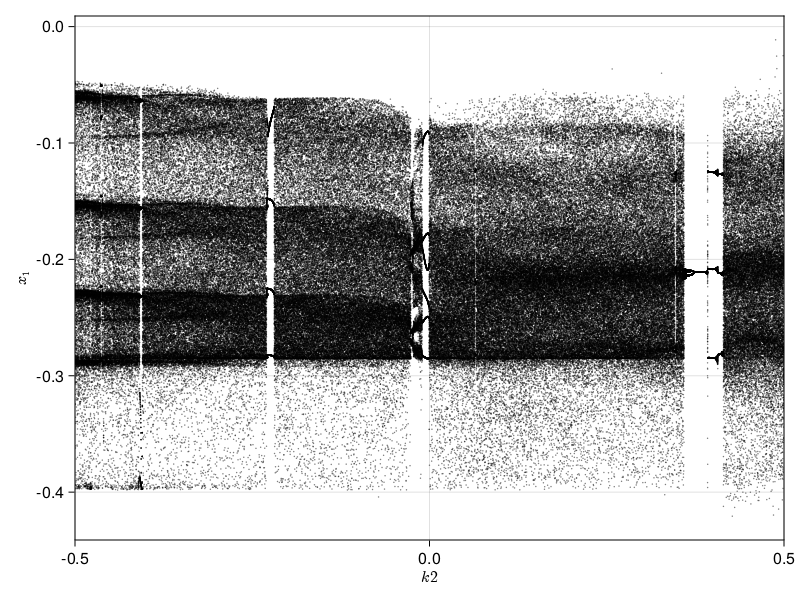

In [15]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k2", ylabel = L"x_{1}")

xlims!(ax, -0.5, 0.5)
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("black", 0.5), markersize = 1.5
    )
end
fig

In [35]:
ds = ds_HR1

pvalues = range(0.0, stop = 1.0, length = 10000)
i = 4
plane = (2, 0.0)
tf = 1000.0
tr = 5000.0
p_index = 12

output1 = produce_orbitdiagram(ds, plane, i, p_index, pvalues,
                              tfinal = tf, Ttr = tr, printparams = true;
                              diffeq = (alg = AutoVern9(Rodas5()), abstol = 1e-11, reltol = 1e-11,  maxiters = 10000000)
                                );

parameter = 0.0
parameter = 0.00010001000100010001
parameter = 0.00020002000200020003
parameter = 0.00030003000300030005
parameter = 0.00040004000400040005
parameter = 0.0005000500050005
parameter = 0.0006000600060006001
parameter = 0.0007000700070007
parameter = 0.0008000800080008001
parameter = 0.0009000900090009
parameter = 0.001000100010001
parameter = 0.0011001100110011
parameter = 0.0012001200120012002
parameter = 0.0013001300130013002
parameter = 0.0014001400140014
parameter = 0.0015001500150015
parameter = 0.0016001600160016002
parameter = 0.0017001700170017002
parameter = 0.0018001800180018
parameter = 0.0019001900190019003
parameter = 0.002000200020002
parameter = 0.0021002100210021
parameter = 0.0022002200220022
parameter = 0.0023002300230023
parameter = 0.0024002400240024004
parameter = 0.0025002500250025004
parameter = 0.0026002600260026003
parameter = 0.0027002700270027003
parameter = 0.0028002800280028
parameter = 0.0029002900290029
parameter = 0.003000300030003
paramete

parameter = 0.025402540254025403
parameter = 0.025502550255025503
parameter = 0.025602560256025603
parameter = 0.025702570257025704
parameter = 0.025802580258025804
parameter = 0.0259025902590259
parameter = 0.026002600260026
parameter = 0.026102610261026102
parameter = 0.026202620262026202
parameter = 0.026302630263026303
parameter = 0.026402640264026403
parameter = 0.026502650265026503
parameter = 0.026602660266026604
parameter = 0.026702670267026704
parameter = 0.0268026802680268
parameter = 0.0269026902690269
parameter = 0.027002700270027002
parameter = 0.027102710271027102
parameter = 0.027202720272027203
parameter = 0.027302730273027303
parameter = 0.027402740274027403
parameter = 0.027502750275027504
parameter = 0.027602760276027604
parameter = 0.027702770277027704
parameter = 0.0278027802780278
parameter = 0.0279027902790279
parameter = 0.028002800280028002
parameter = 0.028102810281028102
parameter = 0.028202820282028203
parameter = 0.028302830283028303
parameter = 0.028402840

parameter = 0.051105110511051106
parameter = 0.05120512051205121
parameter = 0.05130513051305131
parameter = 0.05140514051405141
parameter = 0.05150515051505151
parameter = 0.05160516051605161
parameter = 0.0517051705170517
parameter = 0.0518051805180518
parameter = 0.0519051905190519
parameter = 0.052005200520052
parameter = 0.0521052105210521
parameter = 0.052205220522052204
parameter = 0.052305230523052304
parameter = 0.052405240524052404
parameter = 0.052505250525052505
parameter = 0.052605260526052605
parameter = 0.052705270527052706
parameter = 0.052805280528052806
parameter = 0.052905290529052906
parameter = 0.05300530053005301
parameter = 0.05310531053105311
parameter = 0.05320532053205321
parameter = 0.05330533053305331
parameter = 0.05340534053405341
parameter = 0.05350535053505351
parameter = 0.0536053605360536
parameter = 0.0537053705370537
parameter = 0.0538053805380538
parameter = 0.0539053905390539
parameter = 0.054005400540054004
parameter = 0.054105410541054104
paramet

parameter = 0.07690769076907691
parameter = 0.07700770077007701
parameter = 0.0771077107710771
parameter = 0.0772077207720772
parameter = 0.0773077307730773
parameter = 0.0774077407740774
parameter = 0.0775077507750775
parameter = 0.0776077607760776
parameter = 0.0777077707770777
parameter = 0.0778077807780778
parameter = 0.0779077907790779
parameter = 0.078007800780078
parameter = 0.0781078107810781
parameter = 0.0782078207820782
parameter = 0.0783078307830783
parameter = 0.0784078407840784
parameter = 0.0785078507850785
parameter = 0.0786078607860786
parameter = 0.07870787078707871
parameter = 0.07880788078807881
parameter = 0.07890789078907891
parameter = 0.07900790079007901
parameter = 0.07910791079107911
parameter = 0.07920792079207921
parameter = 0.07930793079307931
parameter = 0.07940794079407941
parameter = 0.07950795079507951
parameter = 0.07960796079607961
parameter = 0.07970797079707971
parameter = 0.07980798079807981
parameter = 0.07990799079907991
parameter = 0.08000800080

parameter = 0.10291029102910292
parameter = 0.10301030103010302
parameter = 0.10311031103110312
parameter = 0.10321032103210322
parameter = 0.10331033103310332
parameter = 0.1034103410341034
parameter = 0.1035103510351035
parameter = 0.1036103610361036
parameter = 0.1037103710371037
parameter = 0.1038103810381038
parameter = 0.1039103910391039
parameter = 0.104010401040104
parameter = 0.1041104110411041
parameter = 0.1042104210421042
parameter = 0.1043104310431043
parameter = 0.10441044104410441
parameter = 0.10451045104510451
parameter = 0.10461046104610461
parameter = 0.10471047104710471
parameter = 0.10481048104810481
parameter = 0.10491049104910491
parameter = 0.10501050105010501
parameter = 0.10511051105110511
parameter = 0.10521052105210521
parameter = 0.10531053105310531
parameter = 0.10541054105410541
parameter = 0.10551055105510551
parameter = 0.10561056105610561
parameter = 0.10571057105710571
parameter = 0.10581058105810581
parameter = 0.10591059105910591
parameter = 0.10601

parameter = 0.12891289128912892
parameter = 0.12901290129012902
parameter = 0.12911291129112912
parameter = 0.12921292129212922
parameter = 0.12931293129312932
parameter = 0.12941294129412942
parameter = 0.12951295129512952
parameter = 0.12961296129612962
parameter = 0.12971297129712972
parameter = 0.12981298129812982
parameter = 0.12991299129912992
parameter = 0.13001300130013002
parameter = 0.13011301130113012
parameter = 0.13021302130213022
parameter = 0.13031303130313032
parameter = 0.13041304130413042
parameter = 0.13051305130513052
parameter = 0.13061306130613062
parameter = 0.13071307130713072
parameter = 0.13081308130813082
parameter = 0.13091309130913092
parameter = 0.13101310131013102
parameter = 0.13111311131113113
parameter = 0.13121312131213123
parameter = 0.13131313131313133
parameter = 0.13141314131413143
parameter = 0.13151315131513153
parameter = 0.1316131613161316
parameter = 0.1317131713171317
parameter = 0.1318131813181318
parameter = 0.1319131913191319
parameter = 

parameter = 0.1551155115511551
parameter = 0.1552155215521552
parameter = 0.1553155315531553
parameter = 0.1554155415541554
parameter = 0.1555155515551555
parameter = 0.1556155615561556
parameter = 0.1557155715571557
parameter = 0.1558155815581558
parameter = 0.1559155915591559
parameter = 0.156015601560156
parameter = 0.1561156115611561
parameter = 0.1562156215621562
parameter = 0.1563156315631563
parameter = 0.1564156415641564
parameter = 0.1565156515651565
parameter = 0.1566156615661566
parameter = 0.1567156715671567
parameter = 0.1568156815681568
parameter = 0.1569156915691569
parameter = 0.157015701570157
parameter = 0.1571157115711571
parameter = 0.1572157215721572
parameter = 0.1573157315731573
parameter = 0.15741574157415741
parameter = 0.15751575157515751
parameter = 0.15761576157615761
parameter = 0.15771577157715772
parameter = 0.15781578157815782
parameter = 0.15791579157915792
parameter = 0.15801580158015802
parameter = 0.15811581158115812
parameter = 0.15821582158215822
p

parameter = 0.18101810181018102
parameter = 0.18111811181118112
parameter = 0.18121812181218122
parameter = 0.18131813181318132
parameter = 0.18141814181418142
parameter = 0.18151815181518152
parameter = 0.18161816181618162
parameter = 0.18171817181718172
parameter = 0.18181818181818182
parameter = 0.18191819181918192
parameter = 0.18201820182018202
parameter = 0.18211821182118212
parameter = 0.18221822182218222
parameter = 0.18231823182318233
parameter = 0.18241824182418243
parameter = 0.18251825182518253
parameter = 0.18261826182618263
parameter = 0.18271827182718273
parameter = 0.18281828182818283
parameter = 0.18291829182918293
parameter = 0.18301830183018303
parameter = 0.18311831183118313
parameter = 0.18321832183218323
parameter = 0.18331833183318333
parameter = 0.18341834183418343
parameter = 0.18351835183518353
parameter = 0.18361836183618363
parameter = 0.18371837183718373
parameter = 0.18381838183818383
parameter = 0.18391839183918393
parameter = 0.18401840184018403
paramete

parameter = 0.2069206920692069
parameter = 0.207020702070207
parameter = 0.2071207120712071
parameter = 0.2072207220722072
parameter = 0.2073207320732073
parameter = 0.2074207420742074
parameter = 0.2075207520752075
parameter = 0.2076207620762076
parameter = 0.2077207720772077
parameter = 0.2078207820782078
parameter = 0.2079207920792079
parameter = 0.208020802080208
parameter = 0.2081208120812081
parameter = 0.2082208220822082
parameter = 0.2083208320832083
parameter = 0.2084208420842084
parameter = 0.2085208520852085
parameter = 0.2086208620862086
parameter = 0.20872087208720871
parameter = 0.20882088208820881
parameter = 0.20892089208920891
parameter = 0.20902090209020902
parameter = 0.20912091209120912
parameter = 0.20922092209220922
parameter = 0.20932093209320932
parameter = 0.20942094209420942
parameter = 0.20952095209520952
parameter = 0.20962096209620962
parameter = 0.20972097209720972
parameter = 0.20982098209820982
parameter = 0.20992099209920992
parameter = 0.21002100210021

parameter = 0.23292329232923292
parameter = 0.23302330233023302
parameter = 0.23312331233123312
parameter = 0.23322332233223322
parameter = 0.23332333233323332
parameter = 0.23342334233423342
parameter = 0.23352335233523352
parameter = 0.23362336233623363
parameter = 0.23372337233723373
parameter = 0.23382338233823383
parameter = 0.23392339233923393
parameter = 0.23402340234023403
parameter = 0.23412341234123413
parameter = 0.23422342234223423
parameter = 0.23432343234323433
parameter = 0.23442344234423443
parameter = 0.23452345234523453
parameter = 0.23462346234623463
parameter = 0.23472347234723473
parameter = 0.23482348234823483
parameter = 0.23492349234923493
parameter = 0.23502350235023503
parameter = 0.23512351235123513
parameter = 0.23522352235223523
parameter = 0.23532353235323533
parameter = 0.23542354235423543
parameter = 0.23552355235523553
parameter = 0.23562356235623563
parameter = 0.23572357235723573
parameter = 0.23582358235823583
parameter = 0.23592359235923593
paramete

parameter = 0.2589258925892589
parameter = 0.25902590259025904
parameter = 0.2591259125912591
parameter = 0.25922592259225924
parameter = 0.2593259325932593
parameter = 0.25942594259425944
parameter = 0.2595259525952595
parameter = 0.25962596259625964
parameter = 0.2597259725972597
parameter = 0.25982598259825984
parameter = 0.2599259925992599
parameter = 0.26002600260026004
parameter = 0.2601260126012601
parameter = 0.26022602260226024
parameter = 0.2603260326032603
parameter = 0.26042604260426044
parameter = 0.2605260526052605
parameter = 0.26062606260626064
parameter = 0.2607260726072607
parameter = 0.26082608260826085
parameter = 0.2609260926092609
parameter = 0.26102610261026105
parameter = 0.2611261126112611
parameter = 0.26122612261226125
parameter = 0.2613261326132613
parameter = 0.26142614261426145
parameter = 0.2615261526152615
parameter = 0.26162616261626165
parameter = 0.2617261726172617
parameter = 0.26182618261826185
parameter = 0.2619261926192619
parameter = 0.2620262026

parameter = 0.285028502850285
parameter = 0.28512851285128515
parameter = 0.2852285228522852
parameter = 0.28532853285328535
parameter = 0.2854285428542854
parameter = 0.28552855285528556
parameter = 0.28562856285628563
parameter = 0.2857285728572857
parameter = 0.28582858285828583
parameter = 0.2859285928592859
parameter = 0.28602860286028603
parameter = 0.2861286128612861
parameter = 0.28622862286228623
parameter = 0.2863286328632863
parameter = 0.28642864286428643
parameter = 0.2865286528652865
parameter = 0.28662866286628663
parameter = 0.2867286728672867
parameter = 0.28682868286828683
parameter = 0.2869286928692869
parameter = 0.28702870287028703
parameter = 0.2871287128712871
parameter = 0.28722872287228723
parameter = 0.2873287328732873
parameter = 0.28742874287428744
parameter = 0.2875287528752875
parameter = 0.28762876287628764
parameter = 0.2877287728772877
parameter = 0.28782878287828784
parameter = 0.2879287928792879
parameter = 0.28802880288028804
parameter = 0.2881288128

parameter = 0.31113111311131114
parameter = 0.3112311231123112
parameter = 0.31133113311331134
parameter = 0.3114311431143114
parameter = 0.31153115311531154
parameter = 0.3116311631163116
parameter = 0.31173117311731174
parameter = 0.3118311831183118
parameter = 0.31193119311931194
parameter = 0.312031203120312
parameter = 0.31213121312131215
parameter = 0.3122312231223122
parameter = 0.31233123312331235
parameter = 0.3124312431243124
parameter = 0.31253125312531255
parameter = 0.3126312631263126
parameter = 0.31273127312731275
parameter = 0.3128312831283128
parameter = 0.31293129312931295
parameter = 0.313031303130313
parameter = 0.31313131313131315
parameter = 0.3132313231323132
parameter = 0.31333133313331335
parameter = 0.3134313431343134
parameter = 0.31353135313531355
parameter = 0.3136313631363136
parameter = 0.31373137313731375
parameter = 0.3138313831383138
parameter = 0.31393139313931395
parameter = 0.314031403140314
parameter = 0.31413141314131415
parameter = 0.314231423142

parameter = 0.33713371337133713
parameter = 0.33723372337233726
parameter = 0.33733373337333733
parameter = 0.33743374337433746
parameter = 0.33753375337533753
parameter = 0.33763376337633766
parameter = 0.33773377337733773
parameter = 0.33783378337833786
parameter = 0.33793379337933793
parameter = 0.33803380338033806
parameter = 0.33813381338133813
parameter = 0.33823382338233826
parameter = 0.33833383338333833
parameter = 0.3384338433843384
parameter = 0.33853385338533853
parameter = 0.3386338633863386
parameter = 0.33873387338733874
parameter = 0.3388338833883388
parameter = 0.33893389338933894
parameter = 0.339033903390339
parameter = 0.33913391339133914
parameter = 0.3392339233923392
parameter = 0.33933393339333934
parameter = 0.3394339433943394
parameter = 0.33953395339533954
parameter = 0.3396339633963396
parameter = 0.33973397339733974
parameter = 0.3398339833983398
parameter = 0.33993399339933994
parameter = 0.34003400340034
parameter = 0.34013401340134014
parameter = 0.340234

parameter = 0.3631363136313631
parameter = 0.36323632363236324
parameter = 0.3633363336333633
parameter = 0.36343634363436345
parameter = 0.3635363536353635
parameter = 0.36363636363636365
parameter = 0.3637363736373637
parameter = 0.36383638363836385
parameter = 0.3639363936393639
parameter = 0.36403640364036405
parameter = 0.3641364136413641
parameter = 0.36423642364236425
parameter = 0.3643364336433643
parameter = 0.36443644364436445
parameter = 0.3645364536453645
parameter = 0.36463646364636465
parameter = 0.3647364736473647
parameter = 0.36483648364836485
parameter = 0.3649364936493649
parameter = 0.36503650365036505
parameter = 0.3651365136513651
parameter = 0.36523652365236525
parameter = 0.3653365336533653
parameter = 0.36543654365436545
parameter = 0.3655365536553655
parameter = 0.36563656365636565
parameter = 0.3657365736573657
parameter = 0.36583658365836585
parameter = 0.3659365936593659
parameter = 0.36603660366036606
parameter = 0.36613661366136613
parameter = 0.366236623

parameter = 0.38913891389138916
parameter = 0.38923892389238923
parameter = 0.38933893389338936
parameter = 0.38943894389438943
parameter = 0.38953895389538956
parameter = 0.38963896389638963
parameter = 0.38973897389738976
parameter = 0.38983898389838983
parameter = 0.38993899389938996
parameter = 0.39003900390039004
parameter = 0.39013901390139016
parameter = 0.39023902390239024
parameter = 0.39033903390339036
parameter = 0.39043904390439044
parameter = 0.39053905390539057
parameter = 0.39063906390639064
parameter = 0.39073907390739077
parameter = 0.39083908390839084
parameter = 0.39093909390939097
parameter = 0.39103910391039104
parameter = 0.3911391139113911
parameter = 0.39123912391239124
parameter = 0.3913391339133913
parameter = 0.39143914391439144
parameter = 0.3915391539153915
parameter = 0.39163916391639164
parameter = 0.3917391739173917
parameter = 0.39183918391839184
parameter = 0.3919391939193919
parameter = 0.39203920392039204
parameter = 0.3921392139213921
parameter = 0.

parameter = 0.415041504150415
parameter = 0.41514151415141515
parameter = 0.4152415241524152
parameter = 0.41534153415341535
parameter = 0.4154415441544154
parameter = 0.41554155415541555
parameter = 0.4156415641564156
parameter = 0.41574157415741575
parameter = 0.4158415841584158
parameter = 0.41594159415941595
parameter = 0.416041604160416
parameter = 0.41614161416141615
parameter = 0.4162416241624162
parameter = 0.41634163416341635
parameter = 0.4164416441644164
parameter = 0.41654165416541655
parameter = 0.4166416641664166
parameter = 0.41674167416741675
parameter = 0.4168416841684168
parameter = 0.41694169416941695
parameter = 0.417041704170417
parameter = 0.41714171417141716
parameter = 0.4172417241724172
parameter = 0.41734173417341736
parameter = 0.41744174417441743
parameter = 0.41754175417541756
parameter = 0.41764176417641763
parameter = 0.41774177417741776
parameter = 0.41784178417841783
parameter = 0.41794179417941796
parameter = 0.41804180418041803
parameter = 0.418141814

parameter = 0.44104410441044106
parameter = 0.44114411441144114
parameter = 0.44124412441244126
parameter = 0.44134413441344134
parameter = 0.44144414441444146
parameter = 0.44154415441544154
parameter = 0.44164416441644166
parameter = 0.44174417441744174
parameter = 0.44184418441844187
parameter = 0.44194419441944194
parameter = 0.44204420442044207
parameter = 0.44214421442144214
parameter = 0.44224422442244227
parameter = 0.44234423442344234
parameter = 0.44244424442444247
parameter = 0.44254425442544254
parameter = 0.44264426442644267
parameter = 0.44274427442744274
parameter = 0.44284428442844287
parameter = 0.44294429442944294
parameter = 0.44304430443044307
parameter = 0.44314431443144314
parameter = 0.44324432443244327
parameter = 0.44334433443344334
parameter = 0.44344434443444347
parameter = 0.44354435443544354
parameter = 0.4436443644364436
parameter = 0.44374437443744374
parameter = 0.4438443844384438
parameter = 0.44394439443944395
parameter = 0.444044404440444
parameter = 

parameter = 0.46684668466846685
parameter = 0.4669466946694669
parameter = 0.46704670467046705
parameter = 0.4671467146714671
parameter = 0.46724672467246725
parameter = 0.4673467346734673
parameter = 0.46744674467446745
parameter = 0.4675467546754675
parameter = 0.46764676467646765
parameter = 0.4677467746774677
parameter = 0.46784678467846785
parameter = 0.4679467946794679
parameter = 0.46804680468046805
parameter = 0.4681468146814681
parameter = 0.46824682468246825
parameter = 0.4683468346834683
parameter = 0.46844684468446846
parameter = 0.46854685468546853
parameter = 0.46864686468646866
parameter = 0.46874687468746873
parameter = 0.46884688468846886
parameter = 0.46894689468946893
parameter = 0.46904690469046906
parameter = 0.46914691469146913
parameter = 0.46924692469246926
parameter = 0.46934693469346933
parameter = 0.46944694469446946
parameter = 0.46954695469546953
parameter = 0.46964696469646966
parameter = 0.46974697469746973
parameter = 0.46984698469846986
parameter = 0.46

parameter = 0.49254925492549256
parameter = 0.49264926492649264
parameter = 0.49274927492749276
parameter = 0.49284928492849284
parameter = 0.49294929492949296
parameter = 0.49304930493049304
parameter = 0.49314931493149317
parameter = 0.49324932493249324
parameter = 0.49334933493349337
parameter = 0.49344934493449344
parameter = 0.49354935493549357
parameter = 0.49364936493649364
parameter = 0.49374937493749377
parameter = 0.49384938493849384
parameter = 0.49394939493949397
parameter = 0.49404940494049404
parameter = 0.49414941494149417
parameter = 0.49424942494249424
parameter = 0.49434943494349437
parameter = 0.49444944494449444
parameter = 0.49454945494549457
parameter = 0.49464946494649464
parameter = 0.49474947494749477
parameter = 0.49484948494849484
parameter = 0.494949494949495
parameter = 0.49504950495049505
parameter = 0.4951495149514952
parameter = 0.49524952495249525
parameter = 0.4953495349534954
parameter = 0.49544954495449545
parameter = 0.4955495549554956
parameter = 0

parameter = 0.5189518951895189
parameter = 0.519051905190519
parameter = 0.5191519151915192
parameter = 0.5192519251925193
parameter = 0.5193519351935193
parameter = 0.5194519451945194
parameter = 0.5195519551955196
parameter = 0.5196519651965197
parameter = 0.5197519751975197
parameter = 0.5198519851985198
parameter = 0.51995199519952
parameter = 0.5200520052005201
parameter = 0.5201520152015201
parameter = 0.5202520252025202
parameter = 0.5203520352035204
parameter = 0.5204520452045205
parameter = 0.5205520552055205
parameter = 0.5206520652065206
parameter = 0.5207520752075208
parameter = 0.5208520852085209
parameter = 0.5209520952095209
parameter = 0.521052105210521
parameter = 0.5211521152115212
parameter = 0.5212521252125213
parameter = 0.5213521352135213
parameter = 0.5214521452145214
parameter = 0.5215521552155216
parameter = 0.5216521652165217
parameter = 0.5217521752175217
parameter = 0.5218521852185218
parameter = 0.521952195219522
parameter = 0.5220522052205221
parameter = 0

parameter = 0.5456545654565457
parameter = 0.5457545754575458
parameter = 0.5458545854585458
parameter = 0.5459545954595459
parameter = 0.5460546054605461
parameter = 0.5461546154615462
parameter = 0.5462546254625462
parameter = 0.5463546354635463
parameter = 0.5464546454645465
parameter = 0.5465546554655466
parameter = 0.5466546654665466
parameter = 0.5467546754675467
parameter = 0.5468546854685469
parameter = 0.546954695469547
parameter = 0.547054705470547
parameter = 0.5471547154715471
parameter = 0.5472547254725473
parameter = 0.5473547354735474
parameter = 0.5474547454745474
parameter = 0.5475547554755475
parameter = 0.5476547654765477
parameter = 0.5477547754775478
parameter = 0.5478547854785478
parameter = 0.547954795479548
parameter = 0.5480548054805481
parameter = 0.5481548154815482
parameter = 0.5482548254825482
parameter = 0.5483548354835484
parameter = 0.5484548454845485
parameter = 0.5485548554855486
parameter = 0.5486548654865486
parameter = 0.5487548754875488
parameter =

parameter = 0.5722572257225722
parameter = 0.5723572357235723
parameter = 0.5724572457245725
parameter = 0.5725572557255726
parameter = 0.5726572657265726
parameter = 0.5727572757275727
parameter = 0.5728572857285729
parameter = 0.572957295729573
parameter = 0.573057305730573
parameter = 0.5731573157315731
parameter = 0.5732573257325733
parameter = 0.5733573357335734
parameter = 0.5734573457345734
parameter = 0.5735573557355735
parameter = 0.5736573657365737
parameter = 0.5737573757375738
parameter = 0.5738573857385738
parameter = 0.5739573957395739
parameter = 0.5740574057405741
parameter = 0.5741574157415742
parameter = 0.5742574257425742
parameter = 0.5743574357435743
parameter = 0.5744574457445745
parameter = 0.5745574557455746
parameter = 0.5746574657465746
parameter = 0.5747574757475747
parameter = 0.5748574857485749
parameter = 0.574957495749575
parameter = 0.575057505750575
parameter = 0.5751575157515751
parameter = 0.5752575257525753
parameter = 0.5753575357535754
parameter = 

parameter = 0.5988598859885989
parameter = 0.598959895989599
parameter = 0.5990599059905991
parameter = 0.5991599159915991
parameter = 0.5992599259925993
parameter = 0.5993599359935994
parameter = 0.5994599459945995
parameter = 0.5995599559955995
parameter = 0.5996599659965997
parameter = 0.5997599759975998
parameter = 0.5998599859985999
parameter = 0.5999599959995999
parameter = 0.6000600060006
parameter = 0.6001600160016002
parameter = 0.6002600260026003
parameter = 0.6003600360036003
parameter = 0.6004600460046005
parameter = 0.6005600560056006
parameter = 0.6006600660066007
parameter = 0.6007600760076007
parameter = 0.6008600860086009
parameter = 0.600960096009601
parameter = 0.6010601060106011
parameter = 0.6011601160116011
parameter = 0.6012601260126013
parameter = 0.6013601360136014
parameter = 0.6014601460146015
parameter = 0.6015601560156015
parameter = 0.6016601660166017
parameter = 0.6017601760176018
parameter = 0.6018601860186018
parameter = 0.6019601960196019
parameter = 0

parameter = 0.6255625562556255
parameter = 0.6256625662566256
parameter = 0.6257625762576258
parameter = 0.6258625862586259
parameter = 0.6259625962596259
parameter = 0.626062606260626
parameter = 0.6261626162616262
parameter = 0.6262626262626263
parameter = 0.6263626362636263
parameter = 0.6264626462646264
parameter = 0.6265626562656266
parameter = 0.6266626662666267
parameter = 0.6267626762676267
parameter = 0.6268626862686268
parameter = 0.626962696269627
parameter = 0.6270627062706271
parameter = 0.6271627162716271
parameter = 0.6272627262726272
parameter = 0.6273627362736274
parameter = 0.6274627462746275
parameter = 0.6275627562756275
parameter = 0.6276627662766276
parameter = 0.6277627762776278
parameter = 0.6278627862786279
parameter = 0.6279627962796279
parameter = 0.628062806280628
parameter = 0.6281628162816282
parameter = 0.6282628262826283
parameter = 0.6283628362836283
parameter = 0.6284628462846285
parameter = 0.6285628562856286
parameter = 0.6286628662866287
parameter =

parameter = 0.6521652165216522
parameter = 0.6522652265226523
parameter = 0.6523652365236524
parameter = 0.6524652465246524
parameter = 0.6525652565256526
parameter = 0.6526652665266527
parameter = 0.6527652765276528
parameter = 0.6528652865286528
parameter = 0.652965296529653
parameter = 0.6530653065306531
parameter = 0.6531653165316532
parameter = 0.6532653265326532
parameter = 0.6533653365336534
parameter = 0.6534653465346535
parameter = 0.6535653565356536
parameter = 0.6536653665366536
parameter = 0.6537653765376538
parameter = 0.6538653865386539
parameter = 0.653965396539654
parameter = 0.654065406540654
parameter = 0.6541654165416542
parameter = 0.6542654265426543
parameter = 0.6543654365436543
parameter = 0.6544654465446544
parameter = 0.6545654565456546
parameter = 0.6546654665466547
parameter = 0.6547654765476547
parameter = 0.6548654865486548
parameter = 0.654965496549655
parameter = 0.6550655065506551
parameter = 0.6551655165516551
parameter = 0.6552655265526552
parameter = 

parameter = 0.6787678767876788
parameter = 0.6788678867886788
parameter = 0.678967896789679
parameter = 0.6790679067906791
parameter = 0.6791679167916792
parameter = 0.6792679267926792
parameter = 0.6793679367936794
parameter = 0.6794679467946795
parameter = 0.6795679567956796
parameter = 0.6796679667966796
parameter = 0.6797679767976798
parameter = 0.6798679867986799
parameter = 0.67996799679968
parameter = 0.68006800680068
parameter = 0.6801680168016802
parameter = 0.6802680268026803
parameter = 0.6803680368036804
parameter = 0.6804680468046804
parameter = 0.6805680568056806
parameter = 0.6806680668066807
parameter = 0.6807680768076808
parameter = 0.6808680868086808
parameter = 0.680968096809681
parameter = 0.6810681068106811
parameter = 0.6811681168116812
parameter = 0.6812681268126812
parameter = 0.6813681368136814
parameter = 0.6814681468146815
parameter = 0.6815681568156816
parameter = 0.6816681668166816
parameter = 0.6817681768176818
parameter = 0.6818681868186819
parameter = 0.

parameter = 0.7053705370537053
parameter = 0.7054705470547055
parameter = 0.7055705570557056
parameter = 0.7056705670567057
parameter = 0.7057705770577057
parameter = 0.7058705870587059
parameter = 0.705970597059706
parameter = 0.7060706070607061
parameter = 0.7061706170617061
parameter = 0.7062706270627063
parameter = 0.7063706370637064
parameter = 0.7064706470647065
parameter = 0.7065706570657065
parameter = 0.7066706670667067
parameter = 0.7067706770677068
parameter = 0.7068706870687068
parameter = 0.7069706970697069
parameter = 0.7070707070707071
parameter = 0.7071707170717072
parameter = 0.7072707270727072
parameter = 0.7073707370737073
parameter = 0.7074707470747075
parameter = 0.7075707570757076
parameter = 0.7076707670767076
parameter = 0.7077707770777077
parameter = 0.7078707870787079
parameter = 0.707970797079708
parameter = 0.708070807080708
parameter = 0.7081708170817081
parameter = 0.7082708270827083
parameter = 0.7083708370837084
parameter = 0.7084708470847084
parameter =

parameter = 0.731973197319732
parameter = 0.7320732073207321
parameter = 0.7321732173217321
parameter = 0.7322732273227323
parameter = 0.7323732373237324
parameter = 0.7324732473247325
parameter = 0.7325732573257325
parameter = 0.7326732673267327
parameter = 0.7327732773277328
parameter = 0.7328732873287329
parameter = 0.7329732973297329
parameter = 0.7330733073307331
parameter = 0.7331733173317332
parameter = 0.7332733273327333
parameter = 0.7333733373337333
parameter = 0.7334733473347335
parameter = 0.7335733573357336
parameter = 0.7336733673367337
parameter = 0.7337733773377337
parameter = 0.7338733873387339
parameter = 0.733973397339734
parameter = 0.7340734073407341
parameter = 0.7341734173417341
parameter = 0.7342734273427343
parameter = 0.7343734373437344
parameter = 0.7344734473447345
parameter = 0.7345734573457345
parameter = 0.7346734673467347
parameter = 0.7347734773477348
parameter = 0.7348734873487349
parameter = 0.7349734973497349
parameter = 0.7350735073507351
parameter 

parameter = 0.7585758575857586
parameter = 0.7586758675867586
parameter = 0.7587758775877588
parameter = 0.7588758875887589
parameter = 0.758975897589759
parameter = 0.759075907590759
parameter = 0.7591759175917592
parameter = 0.7592759275927593
parameter = 0.7593759375937594
parameter = 0.7594759475947594
parameter = 0.7595759575957596
parameter = 0.7596759675967597
parameter = 0.7597759775977597
parameter = 0.7598759875987598
parameter = 0.75997599759976
parameter = 0.7600760076007601
parameter = 0.7601760176017601
parameter = 0.7602760276027603
parameter = 0.7603760376037604
parameter = 0.7604760476047605
parameter = 0.7605760576057605
parameter = 0.7606760676067607
parameter = 0.7607760776077608
parameter = 0.7608760876087609
parameter = 0.7609760976097609
parameter = 0.761076107610761
parameter = 0.7611761176117612
parameter = 0.7612761276127613
parameter = 0.7613761376137613
parameter = 0.7614761476147615
parameter = 0.7615761576157616
parameter = 0.7616761676167617
parameter = 0

parameter = 0.7851785178517852
parameter = 0.7852785278527853
parameter = 0.7853785378537854
parameter = 0.7854785478547854
parameter = 0.7855785578557856
parameter = 0.7856785678567857
parameter = 0.7857785778577858
parameter = 0.7858785878587858
parameter = 0.785978597859786
parameter = 0.7860786078607861
parameter = 0.7861786178617862
parameter = 0.7862786278627862
parameter = 0.7863786378637864
parameter = 0.7864786478647865
parameter = 0.7865786578657866
parameter = 0.7866786678667866
parameter = 0.7867786778677868
parameter = 0.7868786878687869
parameter = 0.786978697869787
parameter = 0.787078707870787
parameter = 0.7871787178717872
parameter = 0.7872787278727873
parameter = 0.7873787378737874
parameter = 0.7874787478747874
parameter = 0.7875787578757876
parameter = 0.7876787678767877
parameter = 0.7877787778777878
parameter = 0.7878787878787878
parameter = 0.787978797879788
parameter = 0.7880788078807881
parameter = 0.7881788178817882
parameter = 0.7882788278827882
parameter = 

parameter = 0.8117811781178118
parameter = 0.8118811881188119
parameter = 0.811981198119812
parameter = 0.8120812081208121
parameter = 0.8121812181218122
parameter = 0.8122812281228122
parameter = 0.8123812381238124
parameter = 0.8124812481248125
parameter = 0.8125812581258126
parameter = 0.8126812681268126
parameter = 0.8127812781278128
parameter = 0.8128812881288129
parameter = 0.812981298129813
parameter = 0.813081308130813
parameter = 0.8131813181318132
parameter = 0.8132813281328133
parameter = 0.8133813381338134
parameter = 0.8134813481348134
parameter = 0.8135813581358136
parameter = 0.8136813681368137
parameter = 0.8137813781378138
parameter = 0.8138813881388138
parameter = 0.813981398139814
parameter = 0.8140814081408141
parameter = 0.8141814181418142
parameter = 0.8142814281428142
parameter = 0.8143814381438144
parameter = 0.8144814481448145
parameter = 0.8145814581458146
parameter = 0.8146814681468146
parameter = 0.8147814781478148
parameter = 0.8148814881488149
parameter = 

parameter = 0.8383838383838383
parameter = 0.8384838483848385
parameter = 0.8385838583858386
parameter = 0.8386838683868387
parameter = 0.8387838783878387
parameter = 0.8388838883888389
parameter = 0.838983898389839
parameter = 0.8390839083908391
parameter = 0.8391839183918391
parameter = 0.8392839283928393
parameter = 0.8393839383938394
parameter = 0.8394839483948395
parameter = 0.8395839583958395
parameter = 0.8396839683968397
parameter = 0.8397839783978398
parameter = 0.8398839883988399
parameter = 0.83998399839984
parameter = 0.8400840084008401
parameter = 0.8401840184018402
parameter = 0.8402840284028403
parameter = 0.8403840384038403
parameter = 0.8404840484048405
parameter = 0.8405840584058406
parameter = 0.8406840684068407
parameter = 0.8407840784078408
parameter = 0.8408840884088409
parameter = 0.840984098409841
parameter = 0.8410841084108411
parameter = 0.8411841184118412
parameter = 0.8412841284128413
parameter = 0.8413841384138414
parameter = 0.8414841484148415
parameter = 

parameter = 0.8651865186518651
parameter = 0.8652865286528653
parameter = 0.8653865386538654
parameter = 0.8654865486548655
parameter = 0.8655865586558655
parameter = 0.8656865686568657
parameter = 0.8657865786578658
parameter = 0.8658865886588659
parameter = 0.8659865986598659
parameter = 0.8660866086608661
parameter = 0.8661866186618662
parameter = 0.8662866286628663
parameter = 0.8663866386638663
parameter = 0.8664866486648665
parameter = 0.8665866586658666
parameter = 0.8666866686668667
parameter = 0.8667866786678667
parameter = 0.8668866886688669
parameter = 0.866986698669867
parameter = 0.8670867086708671
parameter = 0.8671867186718671
parameter = 0.8672867286728673
parameter = 0.8673867386738674
parameter = 0.8674867486748675
parameter = 0.8675867586758675
parameter = 0.8676867686768677
parameter = 0.8677867786778678
parameter = 0.8678867886788679
parameter = 0.8679867986798679
parameter = 0.8680868086808681
parameter = 0.8681868186818682
parameter = 0.8682868286828683
parameter

parameter = 0.8917891789178918
parameter = 0.8918891889188919
parameter = 0.891989198919892
parameter = 0.892089208920892
parameter = 0.8921892189218922
parameter = 0.8922892289228923
parameter = 0.8923892389238924
parameter = 0.8924892489248925
parameter = 0.8925892589258926
parameter = 0.8926892689268927
parameter = 0.8927892789278928
parameter = 0.8928892889288929
parameter = 0.892989298929893
parameter = 0.8930893089308931
parameter = 0.8931893189318932
parameter = 0.8932893289328933
parameter = 0.8933893389338934
parameter = 0.8934893489348935
parameter = 0.8935893589358936
parameter = 0.8936893689368937
parameter = 0.8937893789378938
parameter = 0.8938893889388939
parameter = 0.893989398939894
parameter = 0.8940894089408941
parameter = 0.8941894189418942
parameter = 0.8942894289428943
parameter = 0.8943894389438944
parameter = 0.8944894489448945
parameter = 0.8945894589458946
parameter = 0.8946894689468947
parameter = 0.8947894789478947
parameter = 0.8948894889488949
parameter = 

parameter = 0.9183918391839184
parameter = 0.9184918491849184
parameter = 0.9185918591859186
parameter = 0.9186918691869187
parameter = 0.9187918791879188
parameter = 0.9188918891889188
parameter = 0.918991899189919
parameter = 0.9190919091909191
parameter = 0.9191919191919192
parameter = 0.9192919291929192
parameter = 0.9193919391939194
parameter = 0.9194919491949195
parameter = 0.9195919591959196
parameter = 0.9196919691969196
parameter = 0.9197919791979198
parameter = 0.9198919891989199
parameter = 0.91999199919992
parameter = 0.92009200920092
parameter = 0.9201920192019202
parameter = 0.9202920292029203
parameter = 0.9203920392039204
parameter = 0.9204920492049204
parameter = 0.9205920592059206
parameter = 0.9206920692069207
parameter = 0.9207920792079208
parameter = 0.9208920892089208
parameter = 0.920992099209921
parameter = 0.9210921092109211
parameter = 0.9211921192119212
parameter = 0.9212921292129213
parameter = 0.9213921392139214
parameter = 0.9214921492149215
parameter = 0.

parameter = 0.944994499449945
parameter = 0.9450945094509451
parameter = 0.9451945194519452
parameter = 0.9452945294529453
parameter = 0.9453945394539454
parameter = 0.9454945494549455
parameter = 0.9455945594559456
parameter = 0.9456945694569457
parameter = 0.9457945794579458
parameter = 0.9458945894589459
parameter = 0.945994599459946
parameter = 0.9460946094609461
parameter = 0.9461946194619462
parameter = 0.9462946294629463
parameter = 0.9463946394639464
parameter = 0.9464946494649465
parameter = 0.9465946594659466
parameter = 0.9466946694669467
parameter = 0.9467946794679468
parameter = 0.946894689468947
parameter = 0.946994699469947
parameter = 0.9470947094709471
parameter = 0.9471947194719472
parameter = 0.9472947294729473
parameter = 0.9473947394739474
parameter = 0.9474947494749475
parameter = 0.9475947594759476
parameter = 0.9476947694769476
parameter = 0.9477947794779478
parameter = 0.9478947894789479
parameter = 0.947994799479948
parameter = 0.948094809480948
parameter = 0.

parameter = 0.9715971597159716
parameter = 0.9716971697169717
parameter = 0.9717971797179717
parameter = 0.9718971897189719
parameter = 0.971997199719972
parameter = 0.9720972097209721
parameter = 0.9721972197219722
parameter = 0.9722972297229723
parameter = 0.9723972397239724
parameter = 0.9724972497249725
parameter = 0.9725972597259726
parameter = 0.9726972697269727
parameter = 0.9727972797279728
parameter = 0.9728972897289729
parameter = 0.972997299729973
parameter = 0.9730973097309731
parameter = 0.9731973197319732
parameter = 0.9732973297329733
parameter = 0.9733973397339734
parameter = 0.9734973497349735
parameter = 0.9735973597359736
parameter = 0.9736973697369737
parameter = 0.9737973797379738
parameter = 0.9738973897389739
parameter = 0.973997399739974
parameter = 0.9740974097409741
parameter = 0.9741974197419742
parameter = 0.9742974297429743
parameter = 0.9743974397439744
parameter = 0.9744974497449745
parameter = 0.9745974597459746
parameter = 0.9746974697469747
parameter =

parameter = 0.9981998199819982
parameter = 0.9982998299829983
parameter = 0.9983998399839984
parameter = 0.9984998499849985
parameter = 0.9985998599859987
parameter = 0.9986998699869987
parameter = 0.9987998799879988
parameter = 0.9988998899889989
parameter = 0.998999899989999
parameter = 0.9990999099909991
parameter = 0.9991999199919992
parameter = 0.9992999299929993
parameter = 0.9993999399939995
parameter = 0.9994999499949995
parameter = 0.9995999599959996
parameter = 0.9996999699969997
parameter = 0.9997999799979999
parameter = 0.9998999899989999
parameter = 1.0


In [37]:
# orbit diagram x1 + orbit diagram x2
outputsum = output + output1;

In [ ]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k", ylabel = L"x_{||}")

xlims!(ax, 0.28, 0.325)


pvalues = range(0.0, stop = 1.0, length = 10000)
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(outputsum[j])), outputsum[j];
        color = ("black", 0.5), markersize = 1.0)
end

fig

In [ ]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k", ylabel = L"x_{||}")

xlims!(ax, 0.0, 1.0)


pvalues = range(0.0, stop = 1.0, length = 10000)
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(outputsum[j])), outputsum[j];
        color = ("black", 0.5), markersize = 1.0)
end

fig

In [ ]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k", ylabel = L"x_{||}")

xlims!(ax, 0.0, 1.0)


pvalues = range(0.0, stop = 1.0, length = 10000)
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(outputsum[j])), outputsum[j];
        color = ("black", 0.5), markersize = 1.0)
end

fig

In [39]:
ticks = range(0.0, stop = 1.0, step = 0.1)

0.0:0.1:1.0

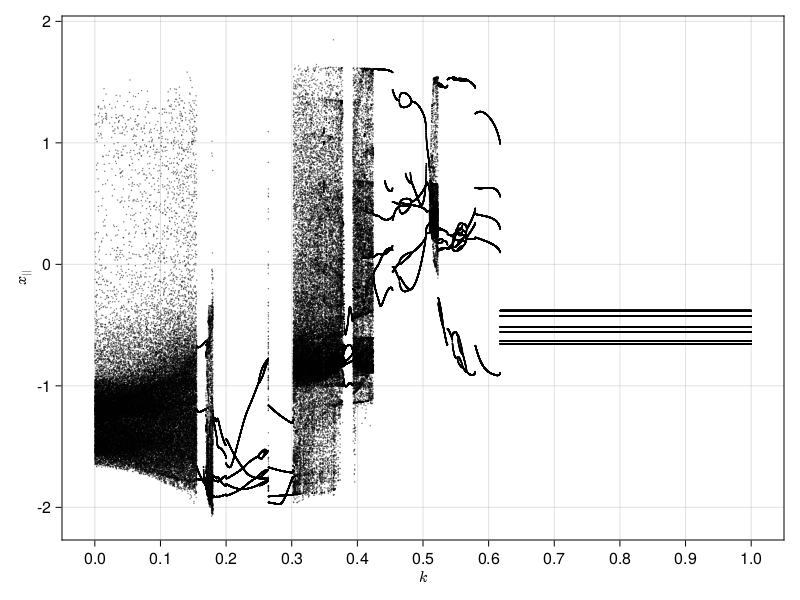

In [43]:
# change k, x_sum plot
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k", ylabel = L"x_{||}", xticks = ticks)
#xlims!(ax, .0, 1.0)

for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(outputsum[j])), outputsum[j];
        color = ("black", 0.5), markersize = 1.5
    )
end
fig

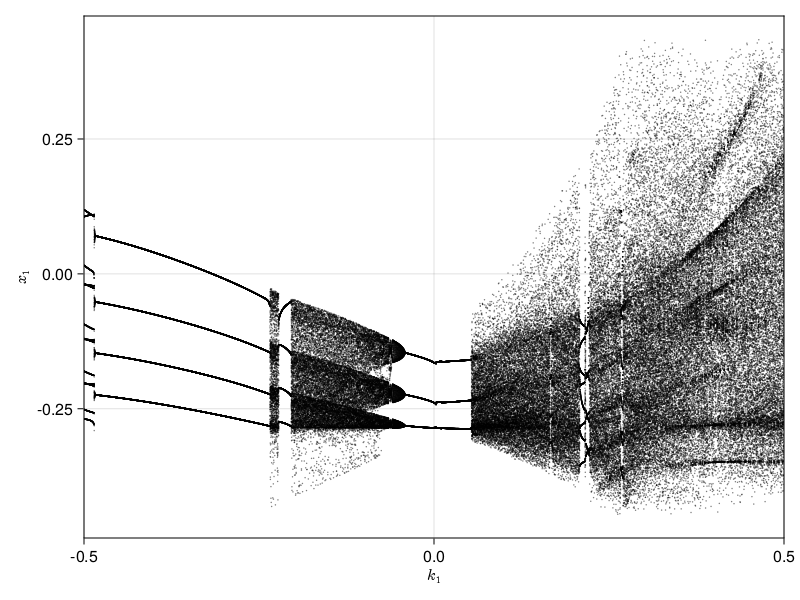

In [43]:
# change k1=k2, forward integrate
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k_{1}", ylabel = L"x_{1}")
xlims!(ax, -0.5, 0.5)
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("black", 0.5), markersize = 1.5
    )
end
fig

parameter = -0.5
parameter = -0.4997999599919984
parameter = -0.4995999199839968
parameter = -0.4993998799759952
parameter = -0.4991998399679936
parameter = -0.498999799959992
parameter = -0.4987997599519904
parameter = -0.4985997199439888
parameter = -0.4983996799359872
parameter = -0.4981996399279856
parameter = -0.497999599919984
parameter = -0.4977995599119824
parameter = -0.49759951990398077
parameter = -0.4973994798959792
parameter = -0.4971994398879776
parameter = -0.496999399879976
parameter = -0.4967993598719744
parameter = -0.4965993198639728
parameter = -0.4963992798559712
parameter = -0.4961992398479696
parameter = -0.495999199839968
parameter = -0.4957991598319664
parameter = -0.4955991198239648
parameter = -0.4953990798159632
parameter = -0.4951990398079616
parameter = -0.49499899979996
parameter = -0.49479895979195837
parameter = -0.4945989197839568
parameter = -0.4943988797759552
parameter = -0.4941988397679536
parameter = -0.493998799759952
parameter = -0.4937987597519

parameter = -0.44898979795959193
parameter = -0.4487897579515903
parameter = -0.4485897179435887
parameter = -0.4483896779355871
parameter = -0.44818963792758554
parameter = -0.4479895979195839
parameter = -0.4477895579115823
parameter = -0.4475895179035807
parameter = -0.4473894778955791
parameter = -0.44718943788757753
parameter = -0.4469893978795759
parameter = -0.4467893578715743
parameter = -0.4465893178635727
parameter = -0.4463892778555711
parameter = -0.44618923784756953
parameter = -0.4459891978395679
parameter = -0.4457891578315663
parameter = -0.4455891178235647
parameter = -0.44538907781556314
parameter = -0.4451890378075615
parameter = -0.4449889977995599
parameter = -0.4447889577915583
parameter = -0.4445889177835567
parameter = -0.44438887777555514
parameter = -0.4441888377675535
parameter = -0.4439887977595519
parameter = -0.4437887577515503
parameter = -0.4435887177435487
parameter = -0.44338867773554713
parameter = -0.4431886377275455
parameter = -0.4429885977195439
p

parameter = -0.39797959591918386
parameter = -0.39777955591118225
parameter = -0.39757951590318064
parameter = -0.397379475895179
parameter = -0.3971794358871774
parameter = -0.39697939587917586
parameter = -0.39677935587117424
parameter = -0.39657931586317263
parameter = -0.396379275855171
parameter = -0.3961792358471694
parameter = -0.39597919583916785
parameter = -0.39577915583116624
parameter = -0.39557911582316463
parameter = -0.395379075815163
parameter = -0.3951790358071614
parameter = -0.39497899579915985
parameter = -0.39477895579115824
parameter = -0.3945789157831566
parameter = -0.394378875775155
parameter = -0.39417883576715346
parameter = -0.39397879575915185
parameter = -0.39377875575115023
parameter = -0.3935787157431486
parameter = -0.393378675735147
parameter = -0.39317863572714545
parameter = -0.39297859571914384
parameter = -0.39277855571114223
parameter = -0.3925785157031406
parameter = -0.392378475695139
parameter = -0.39217843568713745
parameter = -0.3919783956791

parameter = -0.3467693538707742
parameter = -0.34656931386277257
parameter = -0.34636927385477095
parameter = -0.34616923384676934
parameter = -0.34596919383876773
parameter = -0.3457691538307662
parameter = -0.34556911382276456
parameter = -0.34536907381476295
parameter = -0.34516903380676134
parameter = -0.3449689937987597
parameter = -0.34476895379075817
parameter = -0.34456891378275656
parameter = -0.34436887377475495
parameter = -0.34416883376675333
parameter = -0.3439687937587517
parameter = -0.34376875375075017
parameter = -0.34356871374274855
parameter = -0.34336867373474694
parameter = -0.34316863372674533
parameter = -0.3429685937187438
parameter = -0.34276855371074216
parameter = -0.34256851370274055
parameter = -0.34236847369473894
parameter = -0.3421684336867373
parameter = -0.34196839367873577
parameter = -0.34176835367073416
parameter = -0.34156831366273255
parameter = -0.34136827365473094
parameter = -0.3411682336467293
parameter = -0.34096819363872777
parameter = -0.34

parameter = -0.29595919183836766
parameter = -0.29575915183036605
parameter = -0.2955591118223645
parameter = -0.2953590718143629
parameter = -0.29515903180636127
parameter = -0.29495899179835966
parameter = -0.29475895179035805
parameter = -0.2945589117823565
parameter = -0.2943588717743549
parameter = -0.29415883176635327
parameter = -0.29395879175835166
parameter = -0.29375875175035004
parameter = -0.2935587117423485
parameter = -0.2933586717343469
parameter = -0.29315863172634526
parameter = -0.29295859171834365
parameter = -0.29275855171034204
parameter = -0.2925585117023405
parameter = -0.2923584716943389
parameter = -0.29215843168633726
parameter = -0.29195839167833565
parameter = -0.2917583516703341
parameter = -0.2915583116623325
parameter = -0.29135827165433087
parameter = -0.29115823164632926
parameter = -0.29095819163832765
parameter = -0.2907581516303261
parameter = -0.2905581116223245
parameter = -0.29035807161432287
parameter = -0.29015803160632125
parameter = -0.2899579

parameter = -0.2451490298059612
parameter = -0.2449489897979596
parameter = -0.24474894978995798
parameter = -0.2445489097819564
parameter = -0.24434886977395479
parameter = -0.2441488297659532
parameter = -0.2439487897579516
parameter = -0.24374874974994998
parameter = -0.2435487097419484
parameter = -0.24334866973394678
parameter = -0.2431486297259452
parameter = -0.24294858971794359
parameter = -0.242748549709942
parameter = -0.2425485097019404
parameter = -0.24234846969393878
parameter = -0.2421484296859372
parameter = -0.24194838967793558
parameter = -0.241748349669934
parameter = -0.2415483096619324
parameter = -0.24134826965393077
parameter = -0.2411482296459292
parameter = -0.24094818963792758
parameter = -0.240748149629926
parameter = -0.24054810962192438
parameter = -0.24034806961392277
parameter = -0.2401480296059212
parameter = -0.23994798959791958
parameter = -0.239747949589918
parameter = -0.23954790958191638
parameter = -0.2393478695739148
parameter = -0.2391478295659131

parameter = -0.1949389877975595
parameter = -0.19473894778955791
parameter = -0.1945389077815563
parameter = -0.19433886777355472
parameter = -0.1941388277655531
parameter = -0.19393878775755152
parameter = -0.1937387477495499
parameter = -0.1935387077415483
parameter = -0.19333866773354672
parameter = -0.1931386277255451
parameter = -0.19293858771754352
parameter = -0.1927385477095419
parameter = -0.1925385077015403
parameter = -0.1923384676935387
parameter = -0.1921384276855371
parameter = -0.19193838767753552
parameter = -0.1917383476695339
parameter = -0.19153830766153232
parameter = -0.1913382676535307
parameter = -0.1911382276455291
parameter = -0.1909381876375275
parameter = -0.1907381476295259
parameter = -0.19053810762152432
parameter = -0.1903380676135227
parameter = -0.1901380276055211
parameter = -0.1899379875975195
parameter = -0.1897379475895179
parameter = -0.1895379075815163
parameter = -0.1893378675735147
parameter = -0.1891378275655131
parameter = -0.1889377875575115


parameter = -0.14452890578115624
parameter = -0.14432886577315462
parameter = -0.14412882576515304
parameter = -0.14392878575715143
parameter = -0.14372874574914982
parameter = -0.14352870574114823
parameter = -0.14332866573314662
parameter = -0.14312862572514504
parameter = -0.14292858571714342
parameter = -0.14272854570914184
parameter = -0.14252850570114023
parameter = -0.14232846569313862
parameter = -0.14212842568513703
parameter = -0.14192838567713542
parameter = -0.14172834566913384
parameter = -0.14152830566113223
parameter = -0.1413282656531306
parameter = -0.14112822564512903
parameter = -0.14092818563712742
parameter = -0.14072814562912583
parameter = -0.14052810562112422
parameter = -0.14032806561312264
parameter = -0.14012802560512103
parameter = -0.13992798559711941
parameter = -0.13972794558911783
parameter = -0.13952790558111622
parameter = -0.13932786557311463
parameter = -0.13912782556511302
parameter = -0.1389277855571114
parameter = -0.13872774554910983
parameter = 

parameter = -0.09411882376475295
parameter = -0.09391878375675135
parameter = -0.09371874374874975
parameter = -0.09351870374074815
parameter = -0.09331866373274655
parameter = -0.09311862372474494
parameter = -0.09291858371674334
parameter = -0.09271854370874175
parameter = -0.09251850370074015
parameter = -0.09231846369273855
parameter = -0.09211842368473695
parameter = -0.09191838367673534
parameter = -0.09171834366873374
parameter = -0.09151830366073214
parameter = -0.09131826365273055
parameter = -0.09111822364472895
parameter = -0.09091818363672735
parameter = -0.09071814362872574
parameter = -0.09051810362072414
parameter = -0.09031806361272254
parameter = -0.09011802360472095
parameter = -0.08991798359671935
parameter = -0.08971794358871775
parameter = -0.08951790358071614
parameter = -0.08931786357271454
parameter = -0.08911782356471294
parameter = -0.08891778355671134
parameter = -0.08871774354870975
parameter = -0.08851770354070815
parameter = -0.08831766353270654
parameter 

parameter = -0.04410882176435287
parameter = -0.04390878175635127
parameter = -0.04370874174834967
parameter = -0.04350870174034807
parameter = -0.043308661732346466
parameter = -0.04310862172434487
parameter = -0.04290858171634327
parameter = -0.042708541708341666
parameter = -0.04250850170034007
parameter = -0.04230846169233847
parameter = -0.042108421684336865
parameter = -0.04190838167633527
parameter = -0.04170834166833367
parameter = -0.041508301660332064
parameter = -0.041308261652330466
parameter = -0.04110822164432887
parameter = -0.040908181636327264
parameter = -0.040708141628325666
parameter = -0.04050810162032407
parameter = -0.04030806161232246
parameter = -0.040108021604320865
parameter = -0.03990798159631927
parameter = -0.03970794158831766
parameter = -0.039507901580316064
parameter = -0.039307861572314466
parameter = -0.03910782156431286
parameter = -0.03890778155631126
parameter = -0.03870774154830966
parameter = -0.03850770154030806
parameter = -0.03830766153230646


parameter = 0.004700940188037608
parameter = 0.0049009801960392075
parameter = 0.005101020204040808
parameter = 0.005301060212042409
parameter = 0.005501100220044009
parameter = 0.005701140228045609
parameter = 0.005901180236047209
parameter = 0.00610122024404881
parameter = 0.00630126025205041
parameter = 0.00650130026005201
parameter = 0.006701340268053611
parameter = 0.006901380276055211
parameter = 0.007101420284056812
parameter = 0.007301460292058411
parameter = 0.007501500300060012
parameter = 0.0077015403080616125
parameter = 0.007901580316063212
parameter = 0.008101620324064814
parameter = 0.008301660332066413
parameter = 0.008501700340068013
parameter = 0.008701740348069614
parameter = 0.008901780356071214
parameter = 0.009101820364072815
parameter = 0.009301860372074415
parameter = 0.009501900380076015
parameter = 0.009701940388077616
parameter = 0.009901980396079216
parameter = 0.010102020404080815
parameter = 0.010302060412082417
parameter = 0.010502100420084017
parameter =

parameter = 0.05511102220444089
parameter = 0.05531106221244249
parameter = 0.055511102220444086
parameter = 0.05571114222844569
parameter = 0.05591118223644729
parameter = 0.05611122224444889
parameter = 0.05631126225245049
parameter = 0.05651130226045209
parameter = 0.05671134226845369
parameter = 0.05691138227645529
parameter = 0.05711142228445689
parameter = 0.05731146229245849
parameter = 0.05751150230046009
parameter = 0.05771154230846169
parameter = 0.05791158231646329
parameter = 0.058111622324464894
parameter = 0.05831166233246649
parameter = 0.0585117023404681
parameter = 0.058711742348469695
parameter = 0.05891178235647129
parameter = 0.0591118223644729
parameter = 0.059311862372474496
parameter = 0.059511902380476094
parameter = 0.0597119423884777
parameter = 0.059911982396479296
parameter = 0.060112022404480894
parameter = 0.0603120624124825
parameter = 0.0605121024204841
parameter = 0.060712142428485695
parameter = 0.0609121824364873
parameter = 0.0611122224444889
paramet

parameter = 0.10652130426085217
parameter = 0.10672134426885377
parameter = 0.10692138427685537
parameter = 0.10712142428485698
parameter = 0.10732146429285858
parameter = 0.10752150430086017
parameter = 0.10772154430886177
parameter = 0.10792158431686337
parameter = 0.10812162432486497
parameter = 0.10832166433286658
parameter = 0.10852170434086818
parameter = 0.10872174434886978
parameter = 0.10892178435687137
parameter = 0.10912182436487297
parameter = 0.10932186437287457
parameter = 0.10952190438087618
parameter = 0.10972194438887778
parameter = 0.10992198439687938
parameter = 0.11012202440488097
parameter = 0.11032206441288257
parameter = 0.11052210442088417
parameter = 0.11072214442888578
parameter = 0.11092218443688738
parameter = 0.11112222444488898
parameter = 0.11132226445289058
parameter = 0.11152230446089217
parameter = 0.11172234446889377
parameter = 0.11192238447689538
parameter = 0.11212242448489698
parameter = 0.11232246449289858
parameter = 0.11252250450090018
paramete

parameter = 0.15833166633326665
parameter = 0.15853170634126826
parameter = 0.15873174634926984
parameter = 0.15893178635727145
parameter = 0.15913182636527307
parameter = 0.15933186637327465
parameter = 0.15953190638127626
parameter = 0.15973194638927785
parameter = 0.15993198639727946
parameter = 0.16013202640528107
parameter = 0.16033206641328265
parameter = 0.16053210642128427
parameter = 0.16073214642928585
parameter = 0.16093218643728746
parameter = 0.16113222644528905
parameter = 0.16133226645329066
parameter = 0.16153230646129227
parameter = 0.16173234646929385
parameter = 0.16193238647729546
parameter = 0.16213242648529705
parameter = 0.16233246649329866
parameter = 0.16253250650130027
parameter = 0.16273254650930186
parameter = 0.16293258651730347
parameter = 0.16313262652530505
parameter = 0.16333266653330666
parameter = 0.16353270654130825
parameter = 0.16373274654930986
parameter = 0.16393278655731147
parameter = 0.16413282656531306
parameter = 0.16433286657331467
paramete

parameter = 0.21034206841368275
parameter = 0.21054210842168433
parameter = 0.21074214842968594
parameter = 0.21094218843768753
parameter = 0.21114222844568914
parameter = 0.21134226845369075
parameter = 0.21154230846169234
parameter = 0.21174234846969395
parameter = 0.21194238847769553
parameter = 0.21214242848569714
parameter = 0.21234246849369873
parameter = 0.21254250850170034
parameter = 0.21274254850970195
parameter = 0.21294258851770353
parameter = 0.21314262852570515
parameter = 0.21334266853370673
parameter = 0.21354270854170834
parameter = 0.21374274854970995
parameter = 0.21394278855771154
parameter = 0.21414282856571315
parameter = 0.21434286857371473
parameter = 0.21454290858171635
parameter = 0.21474294858971793
parameter = 0.21494298859771954
parameter = 0.21514302860572115
parameter = 0.21534306861372274
parameter = 0.21554310862172435
parameter = 0.21574314862972593
parameter = 0.21594318863772755
parameter = 0.21614322864572916
parameter = 0.21634326865373074
paramete

parameter = 0.26255251050210043
parameter = 0.26275255051010205
parameter = 0.2629525905181036
parameter = 0.2631526305261052
parameter = 0.2633526705341068
parameter = 0.26355271054210844
parameter = 0.26375275055011005
parameter = 0.2639527905581116
parameter = 0.2641528305661132
parameter = 0.26435287057411483
parameter = 0.26455291058211644
parameter = 0.264752950590118
parameter = 0.2649529905981196
parameter = 0.2651530306061212
parameter = 0.26535307061412283
parameter = 0.26555311062212444
parameter = 0.265753150630126
parameter = 0.2659531906381276
parameter = 0.2661532306461292
parameter = 0.26635327065413084
parameter = 0.26655331066213245
parameter = 0.266753350670134
parameter = 0.2669533906781356
parameter = 0.2671534306861372
parameter = 0.26735347069413884
parameter = 0.26755351070214045
parameter = 0.267753550710142
parameter = 0.2679535907181436
parameter = 0.26815363072614523
parameter = 0.26835367073414684
parameter = 0.26855371074214845
parameter = 0.26875375075015

parameter = 0.3147629525905181
parameter = 0.31496299259851973
parameter = 0.3151630326065213
parameter = 0.3153630726145229
parameter = 0.3155631126225245
parameter = 0.3157631526305261
parameter = 0.3159631926385277
parameter = 0.3161632326465293
parameter = 0.3163632726545309
parameter = 0.3165633126625325
parameter = 0.3167633526705341
parameter = 0.3169633926785357
parameter = 0.3171634326865373
parameter = 0.3173634726945389
parameter = 0.3175635127025405
parameter = 0.31776355271054213
parameter = 0.3179635927185437
parameter = 0.3181636327265453
parameter = 0.3183636727345469
parameter = 0.3185637127425485
parameter = 0.31876375275055013
parameter = 0.3189637927585517
parameter = 0.3191638327665533
parameter = 0.3193638727745549
parameter = 0.3195639127825565
parameter = 0.31976395279055814
parameter = 0.3199639927985597
parameter = 0.3201640328065613
parameter = 0.3203640728145629
parameter = 0.32056411282256453
parameter = 0.32076415283056614
parameter = 0.3209641928385677
pa

parameter = 0.36717343468693736
parameter = 0.367373474694939
parameter = 0.3675735147029406
parameter = 0.3677735547109422
parameter = 0.3679735947189438
parameter = 0.36817363472694536
parameter = 0.368373674734947
parameter = 0.3685737147429486
parameter = 0.3687737547509502
parameter = 0.3689737947589518
parameter = 0.36917383476695337
parameter = 0.369373874774955
parameter = 0.3695739147829566
parameter = 0.3697739547909582
parameter = 0.3699739947989598
parameter = 0.37017403480696137
parameter = 0.370374074814963
parameter = 0.3705741148229646
parameter = 0.3707741548309662
parameter = 0.3709741948389678
parameter = 0.3711742348469694
parameter = 0.371374274854971
parameter = 0.3715743148629726
parameter = 0.3717743548709742
parameter = 0.3719743948789758
parameter = 0.3721744348869774
parameter = 0.372374474894979
parameter = 0.3725745149029806
parameter = 0.3727745549109822
parameter = 0.37297459491898377
parameter = 0.3731746349269854
parameter = 0.373374674934987
parameter 

parameter = 0.41958391678335666
parameter = 0.41978395679135827
parameter = 0.4199839967993599
parameter = 0.4201840368073615
parameter = 0.42038407681536305
parameter = 0.42058411682336466
parameter = 0.4207841568313663
parameter = 0.4209841968393679
parameter = 0.4211842368473695
parameter = 0.42138427685537105
parameter = 0.42158431686337267
parameter = 0.4217843568713743
parameter = 0.4219843968793759
parameter = 0.4221844368873775
parameter = 0.42238447689537906
parameter = 0.42258451690338067
parameter = 0.4227845569113823
parameter = 0.4229845969193839
parameter = 0.4231846369273855
parameter = 0.42338467693538706
parameter = 0.4235847169433887
parameter = 0.4237847569513903
parameter = 0.4239847969593919
parameter = 0.42418483696739345
parameter = 0.42438487697539506
parameter = 0.4245849169833967
parameter = 0.4247849569913983
parameter = 0.4249849969993999
parameter = 0.42518503700740146
parameter = 0.42538507701540307
parameter = 0.4255851170234047
parameter = 0.425785157031

parameter = 0.47199439887977596
parameter = 0.47219443888777757
parameter = 0.4723944788957792
parameter = 0.47259451890378074
parameter = 0.47279455891178235
parameter = 0.47299459891978396
parameter = 0.47319463892778557
parameter = 0.4733946789357872
parameter = 0.47359471894378874
parameter = 0.47379475895179035
parameter = 0.47399479895979196
parameter = 0.4741948389677936
parameter = 0.4743948789757952
parameter = 0.47459491898379674
parameter = 0.47479495899179835
parameter = 0.47499499899979997
parameter = 0.4751950390078016
parameter = 0.47539507901580313
parameter = 0.47559511902380475
parameter = 0.47579515903180636
parameter = 0.47599519903980797
parameter = 0.4761952390478096
parameter = 0.47639527905581114
parameter = 0.47659531906381275
parameter = 0.47679535907181436
parameter = 0.476995399079816
parameter = 0.4771954390878176
parameter = 0.47739547909581914
parameter = 0.47759551910382075
parameter = 0.47779555911182237
parameter = 0.477995599119824
parameter = 0.47819

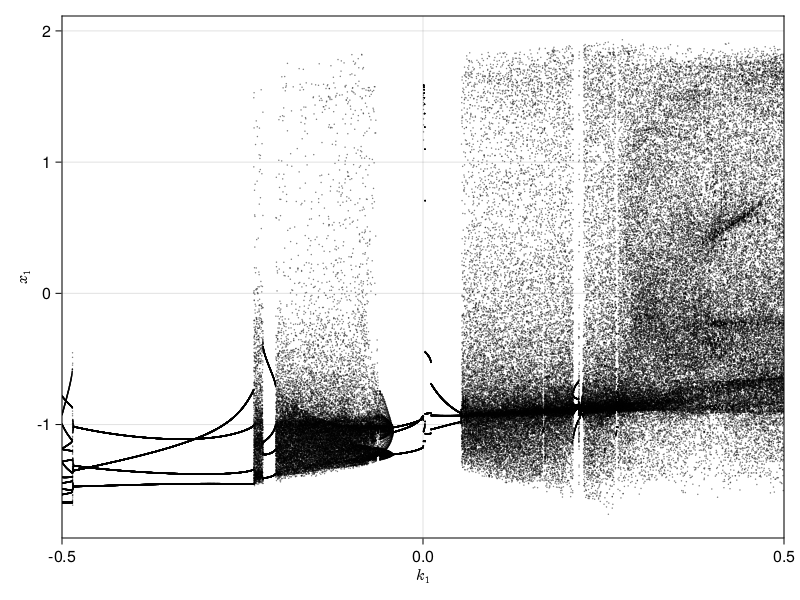

In [44]:
#change k1=k2, backward integrate
ds = ds_HR1

pvalues = range(-0.5, stop = 0.5, length = 5000)
i = 4
plane = (2, 0.0)
tf = 1000.0
tr = 5000.0
p_index = 10

output1 = produce_orbitdiagram(ds, plane, i, p_index, pvalues,
                              tfinal = tf, Ttr = tr, printparams = true;
                              diffeq = (alg = AutoVern9(Rodas5()), abstol = 1e-11, reltol = 1e-11,  maxiters = 10000000)
                                );


fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k_{1}", ylabel = L"x_{1}")
xlims!(ax, -0.5, 0.5)
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(output1[j])), output1[j];
        color = ("black", 0.5), markersize = 1.5
    )
end
fig

In [45]:
outputsum = output + output1;

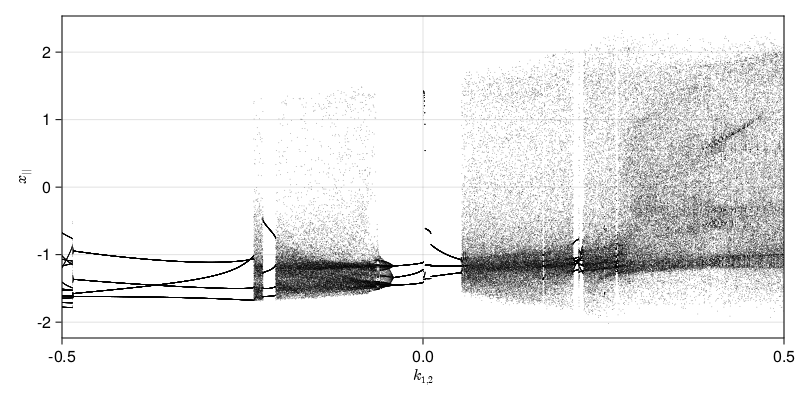

In [77]:
fig = Figure(resolution = (800, 400))
ax = Axis(fig[1,1]; xlabel = L"k_{1,2}", ylabel = L"x_{||}")
xlims!(ax, -0.5, 0.5)
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(outputsum[j])), outputsum[j];
        color = ("black", 0.5), markersize = 0.8
    )
end
fig

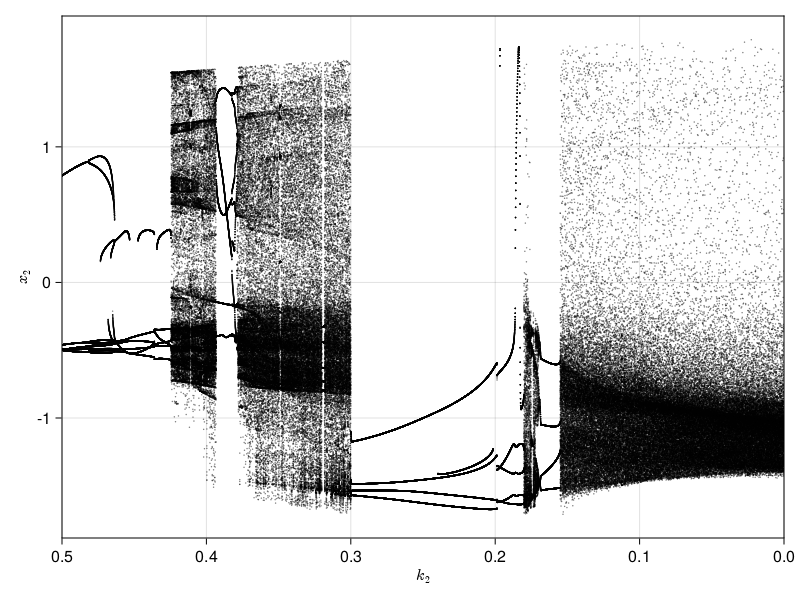

In [53]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k_{2}", ylabel = L"x_{2}")
xlims!(ax, 0.5, 0.0)
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("black", 0.5), markersize = 1.5
    )
end
fig

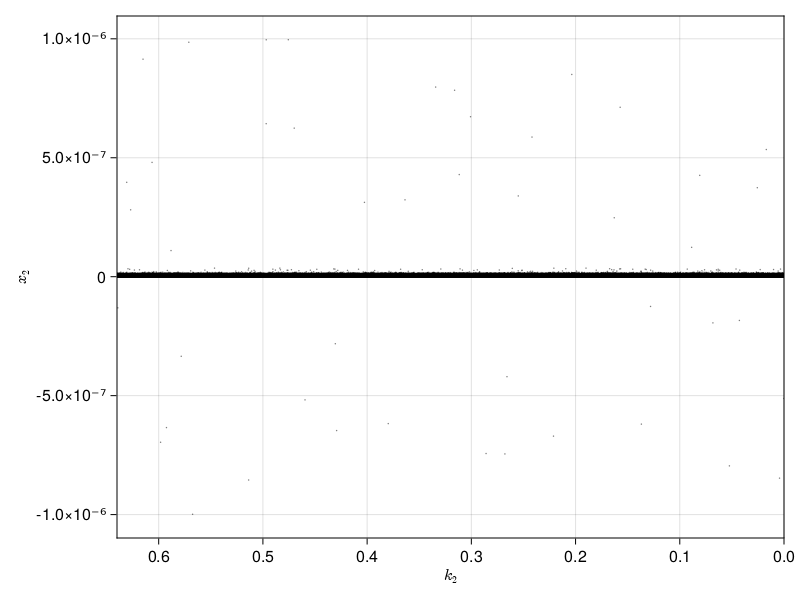

In [47]:
# from regular 
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k_{2}", ylabel = L"x_{2}")
xlims!(ax, 0.64, 0.0)
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("black", 0.5), markersize = 1.5
    )
end
fig

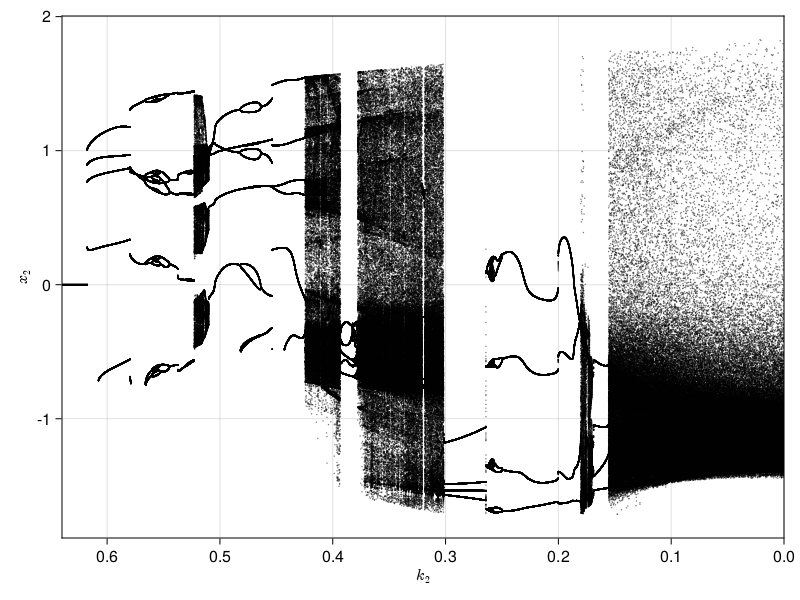

In [44]:
# from chaos 
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k_{2}", ylabel = L"x_{2}")
xlims!(ax, 0.64, 0.0)
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("black", 0.5), markersize = 1.5
    )
end
fig

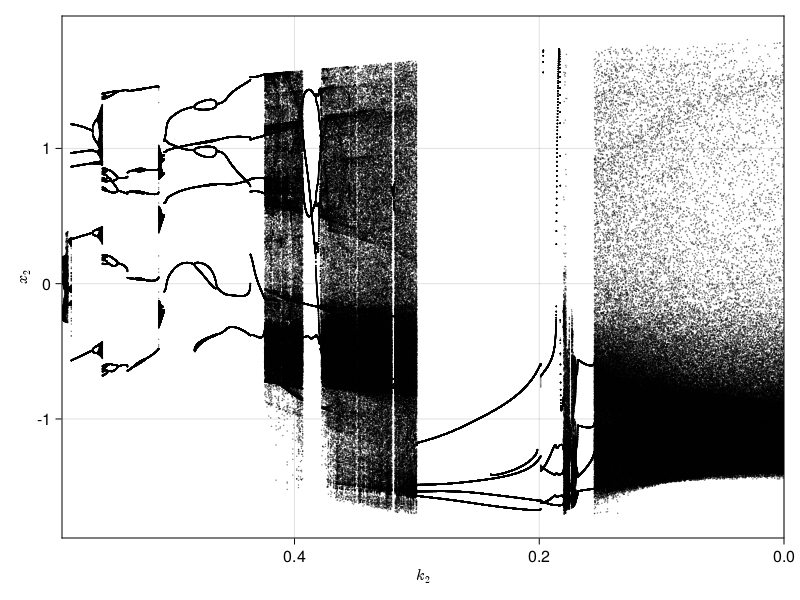

In [24]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k_{2}", ylabel = L"x_{2}")
xlims!(ax, 0.59, 0.0)
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("black", 0.5), markersize = 1.5
    )
end
fig

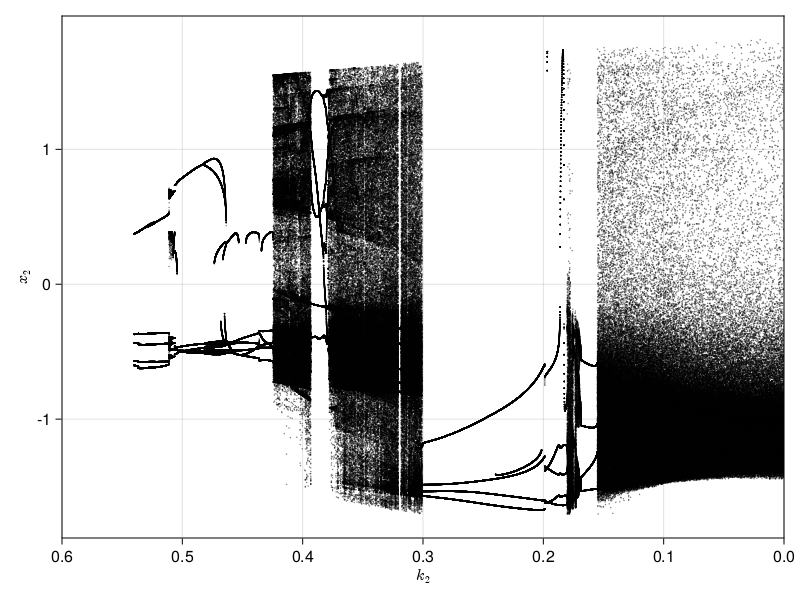

In [21]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k_{2}", ylabel = L"x_{2}")
xlims!(ax, 0.6, 0.0)
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("black", 0.5), markersize = 1.5
    )
end
fig

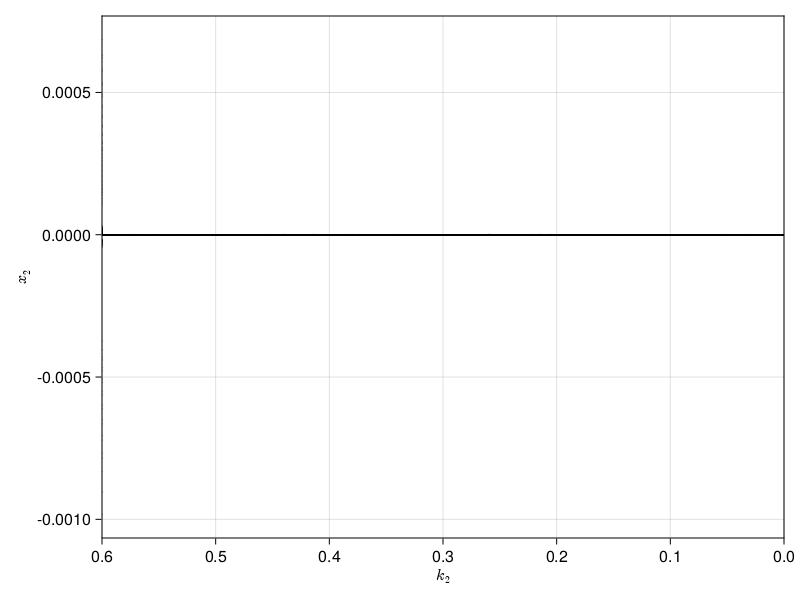

In [18]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k_{2}", ylabel = L"x_{2}")
xlims!(ax, 0.6, 0.0)
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("black", 0.5), markersize = 1.5
    )
end
fig

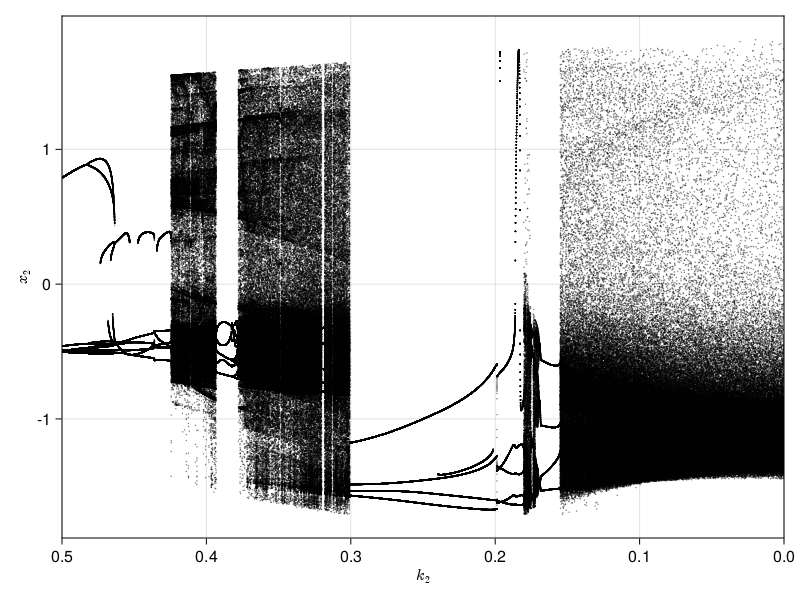

In [14]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k_{2}", ylabel = L"x_{2}")
xlims!(ax, 0.5, 0.0)
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("black", 0.5), markersize = 1.5
    )
end
fig

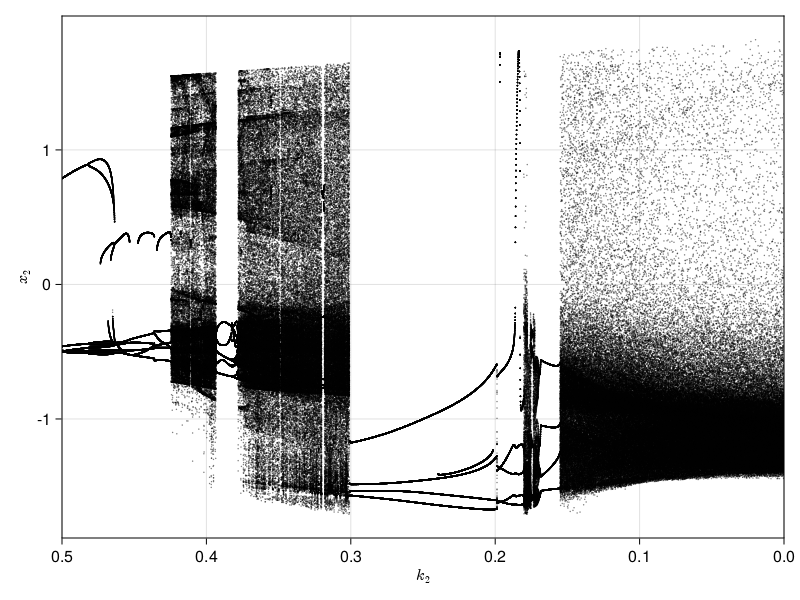

In [10]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k_{2}", ylabel = L"x_{2}")
xlims!(ax, 0.5, 0.0)
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("black", 0.5), markersize = 1.5
    )
end
fig

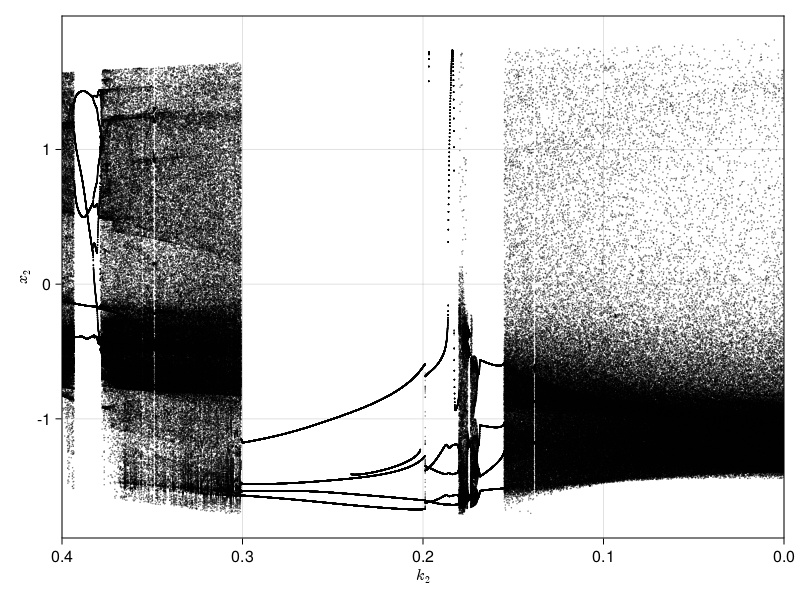

In [7]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k_{2}", ylabel = L"x_{2}")
xlims!(ax, 0.4, 0.0)
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("black", 0.5), markersize = 1.5
    )
end
fig

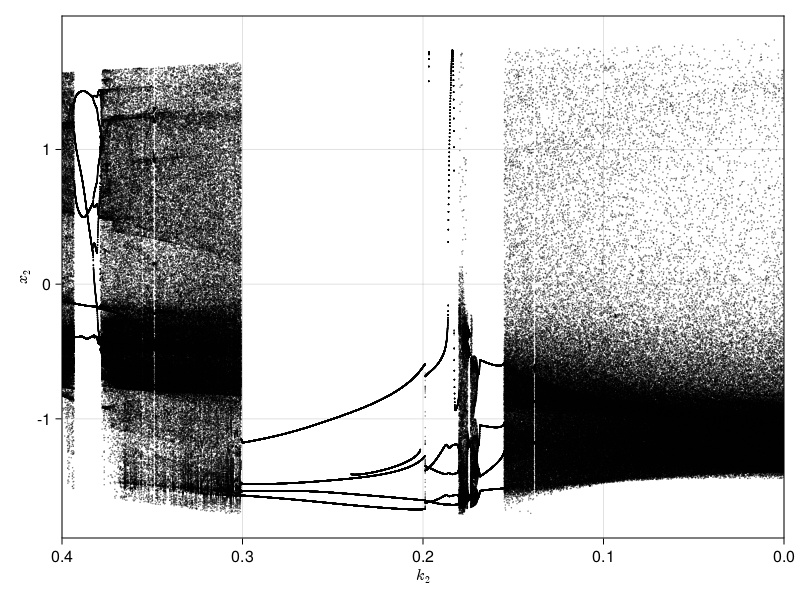

In [72]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k_{2}", ylabel = L"x_{2}")
xlims!(ax, 0.4, 0.0)
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("black", 0.5), markersize = 1.5
    )
end
fig

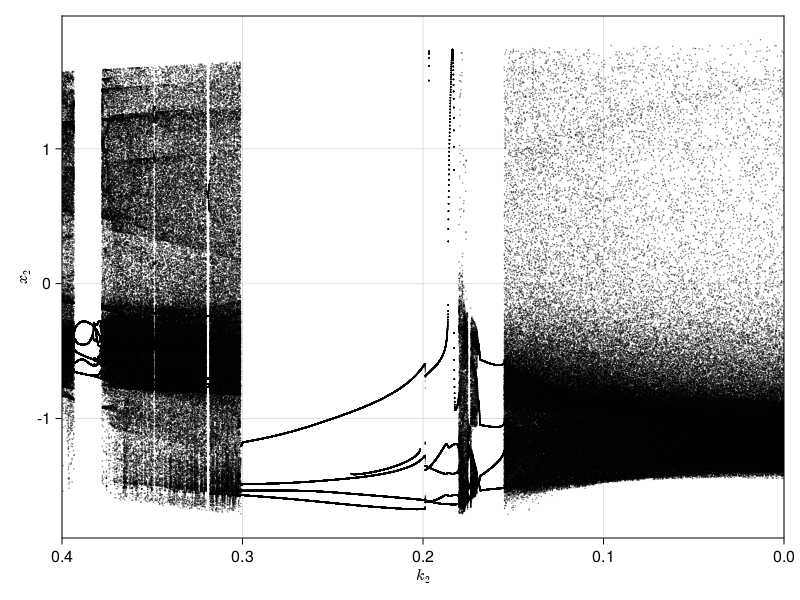

In [66]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k_{2}", ylabel = L"x_{2}")
xlims!(ax, 0.4, 0.0)
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("black", 0.5), markersize = 1.5
    )
end
fig

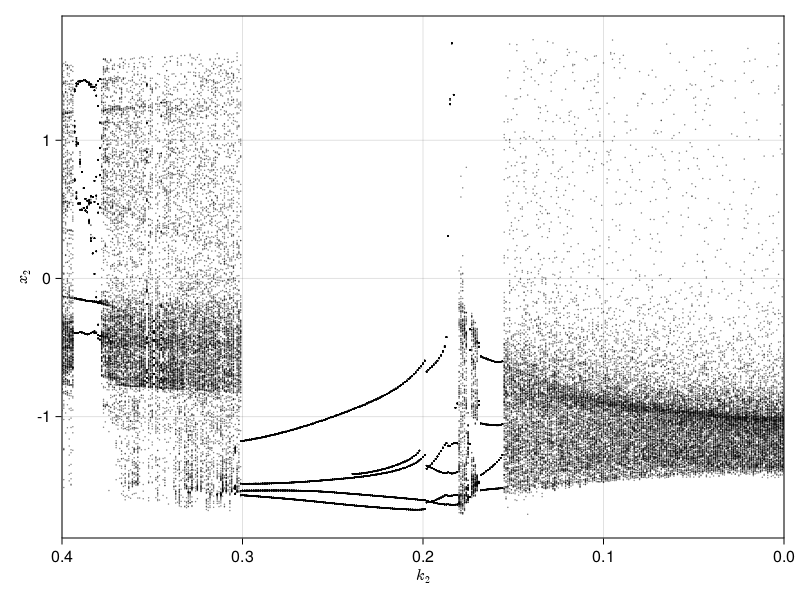

In [36]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k_{2}", ylabel = L"x_{2}")
xlims!(ax, 0.4, 0.0)
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("black", 0.5), markersize = 1.5
    )
end
fig

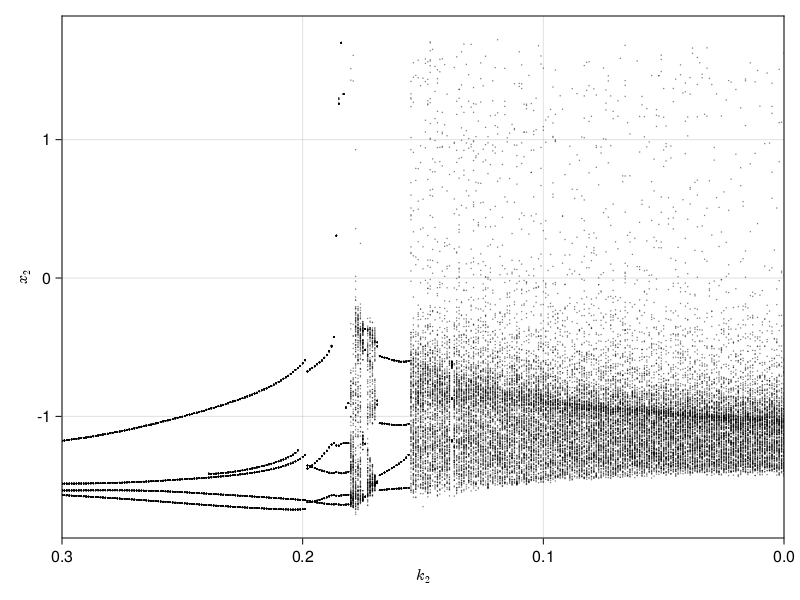

In [33]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k_{2}", ylabel = L"x_{2}")
xlims!(ax, 0.3, 0.0)
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("black", 0.5), markersize = 1.5
    )
end
fig

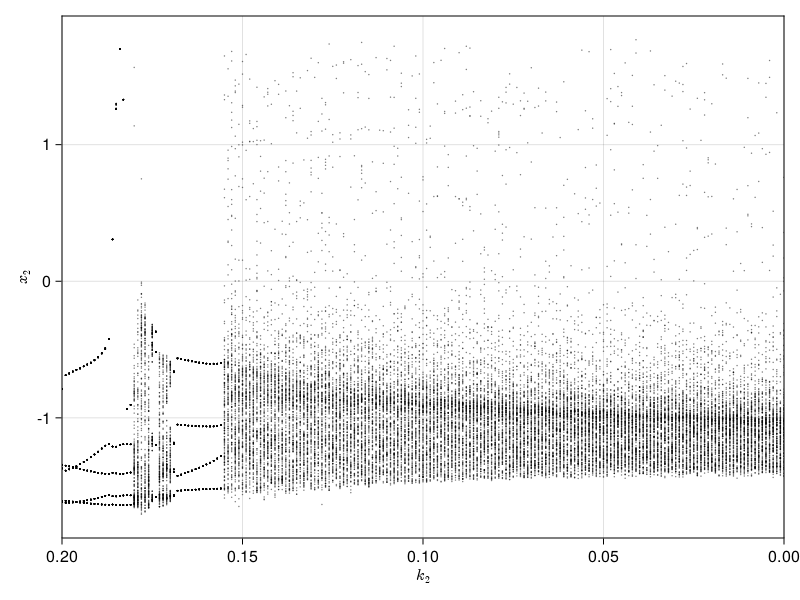

In [30]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k_{2}", ylabel = L"x_{2}")
xlims!(ax, 0.2, 0.0)
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("black", 0.5), markersize = 1.5
    )
end
fig

In [22]:
pvalues = range(0.6, stop = 0, length = 500)
i = 4
plane = (1, 0.0)
tf = 50000.0
p_index = 12

12

12

## с хаотической траектории

In [23]:
output = produce_orbitdiagram(ds_HR1, plane, i, p_index, pvalues,
                              tfinal = tf, Ttr = 25000.0, u0 = condition1;
                              diffeq = (alg = AutoVern9(Rodas5()), abstol = 1e-11, reltol = 1e-11,  maxiters = 10000000)
                                );

In [ ]:
fig = Figure(resolution = (1600, 600), fontsize = 20)
ax = Axis(fig[1,1]; xlabel = L"k", ylabel = L"x_2")
xlims!(ax, 0.6, 0)
for (j, p) in enumerate(pvalues)
    
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("black", 0.5), markersize = 0.8
    )
end
fig

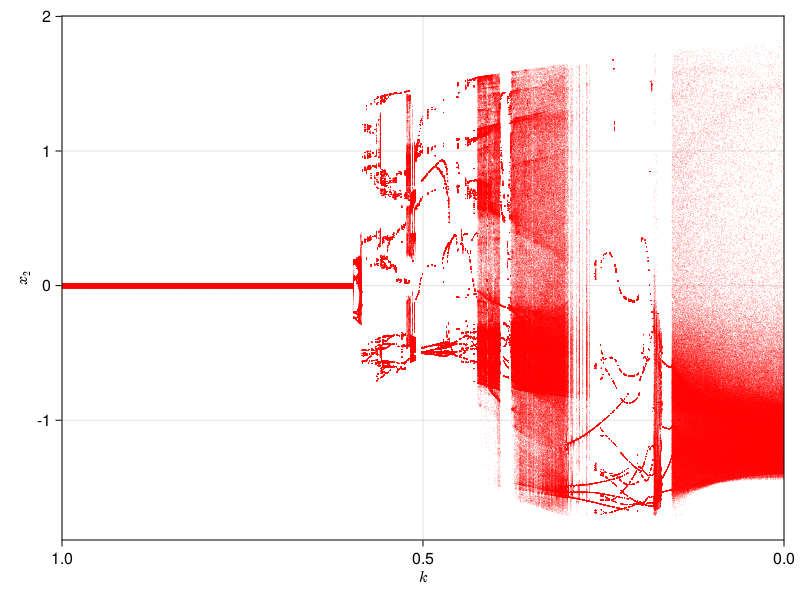

In [22]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k", ylabel = L"x_2")
xlims!(ax, 1, 0)
for (j, p) in enumerate(pvalues)
    
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("red", 0.5), markersize = 0.6
    )
end
fig

## с квазипериодической траектории

In [23]:
output1 = produce_orbitdiagram(ds_HR2, plane, i, p_index, pvalues,
                              tfinal = tf, Ttr = 50000.0, u0 = condition2;
                              diffeq = (alg = AutoVern9(Rodas5()), abstol = 1e-11, reltol = 1e-11,  maxiters = 10000000)
                                );

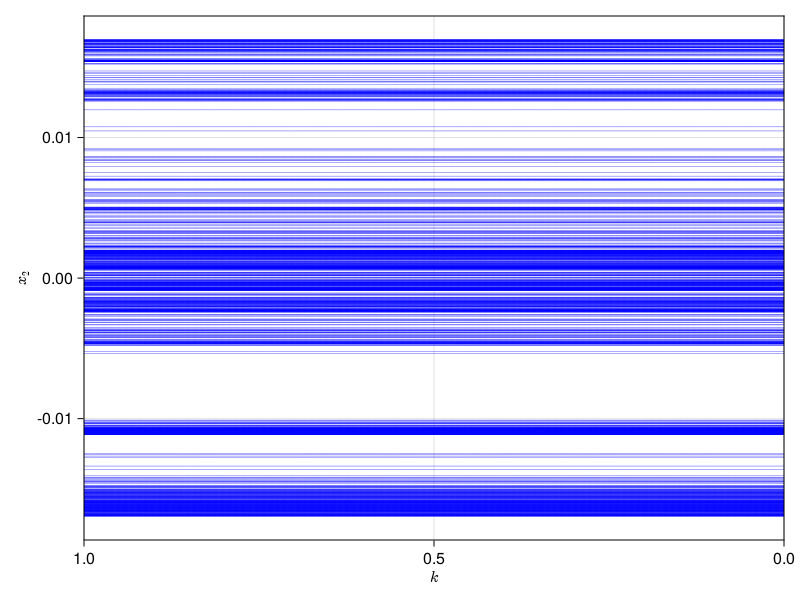

In [24]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k", ylabel = L"x_2")
xlims!(ax, 1, 0)
for (j, p) in enumerate(pvalues)
    
    scatter!(ax, fill(p, length(output1[j])), output1[j];
        color = ("blue", 0.5), markersize = 0.6
    )
end
fig

## с обеих

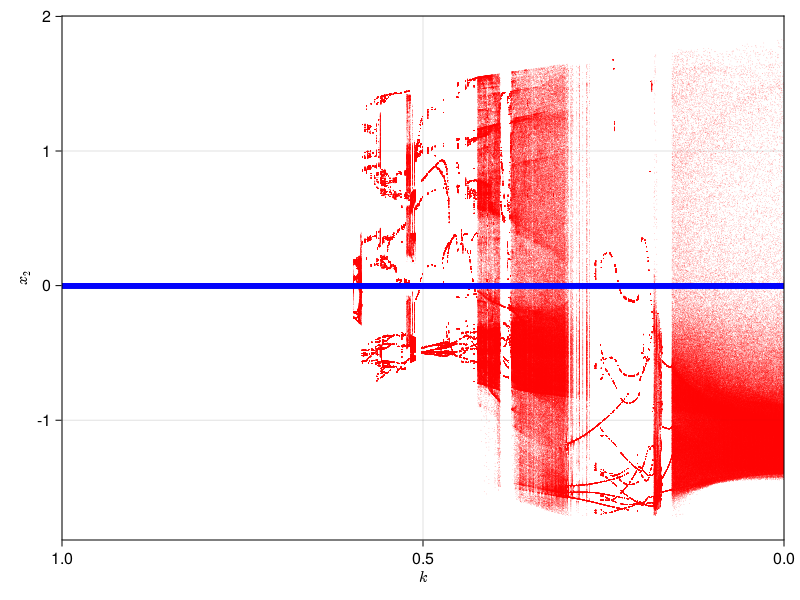

In [25]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k", ylabel = L"x_2")
xlims!(ax, 1, 0)

for (j, p) in enumerate(pvalues)
    
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("red", 0.5), markersize = 0.6
    )
end

for (j, p) in enumerate(pvalues)
    
    scatter!(ax, fill(p, length(output1[j])), output1[j];
        color = ("blue", 0.5), markersize = 0.6
    )
end

fig

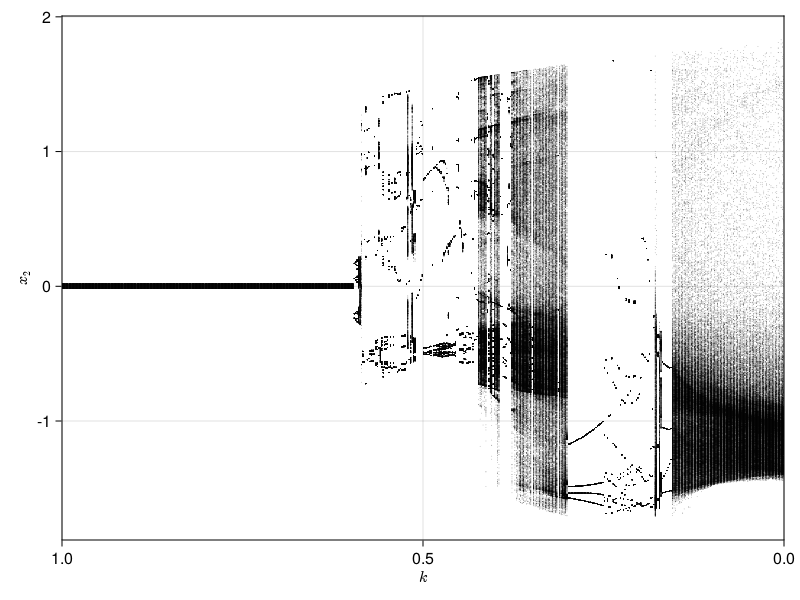

In [11]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k", ylabel = L"x_2")
xlims!(ax, 1, 0)
for (j, p) in enumerate(pvalues)
    
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("black", 0.5), markersize = 0.7
    )
end
fig

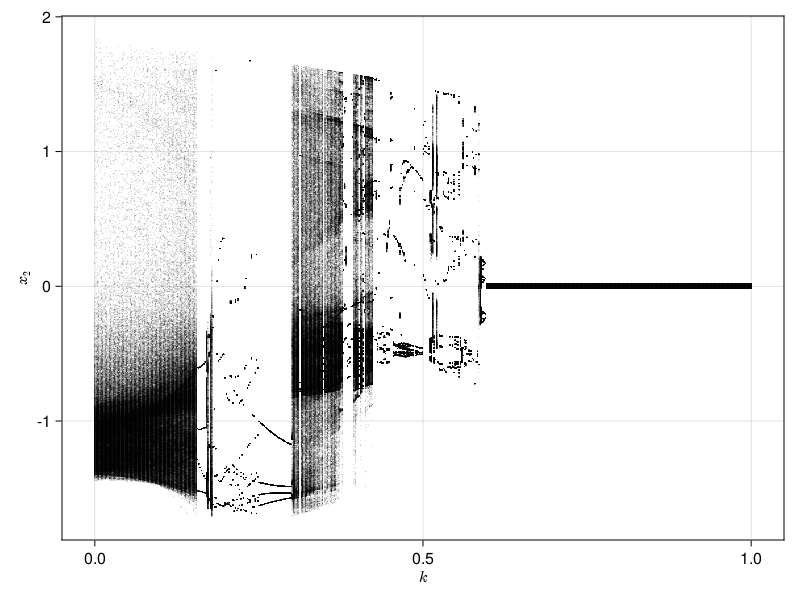

In [12]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k", ylabel = L"x_2")
for (j, p) in enumerate(pvalues)
    
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("black", 0.5), markersize = 0.7
    )
end
fig

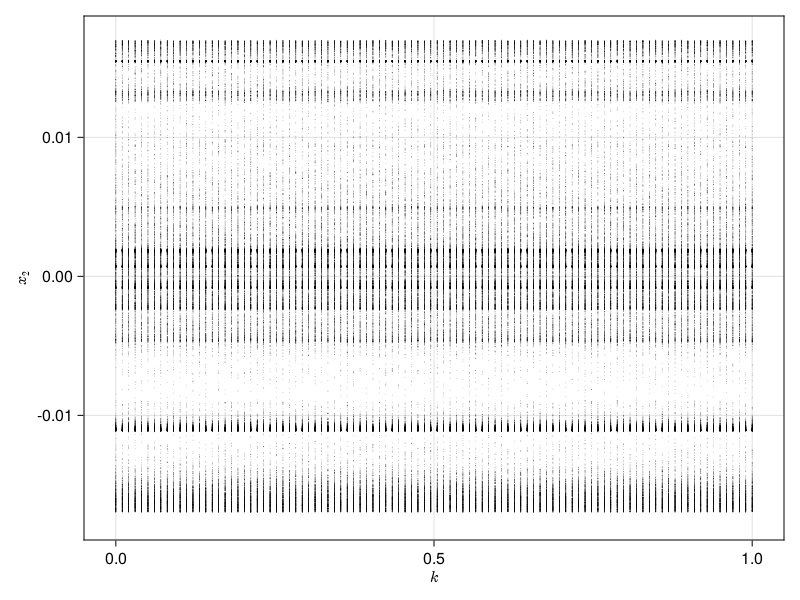

In [8]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k", ylabel = L"x_2")
xlims!(ax, 1, 0)
for (j, p) in enumerate(pvalues)
    
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("black", 0.5), markersize = 0.7
    )
end
fig

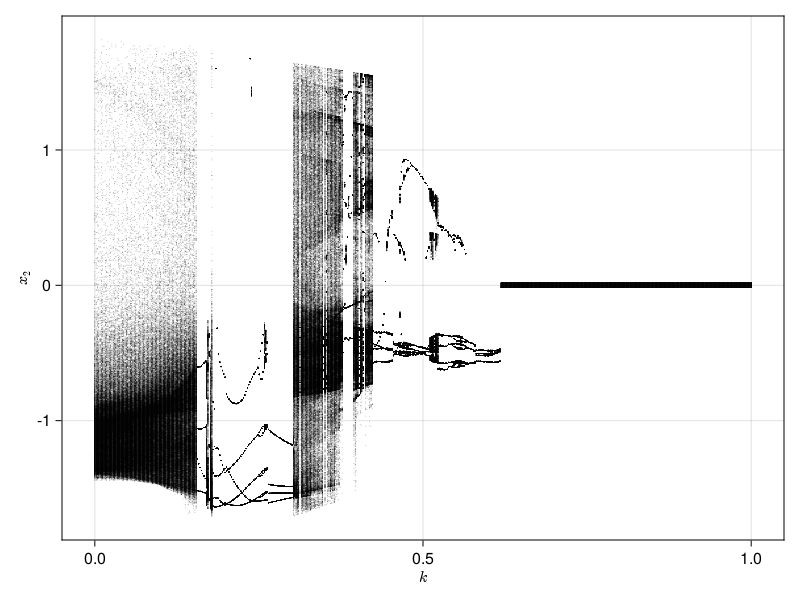

In [14]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k", ylabel = L"x_2")
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("black", 0.5), markersize = 0.7
    )
end
fig

## y1 = 0, plot k in x1

In [16]:
pvalues = range(0, stop = 1, length = 500)
i = 1

plane = (2, 0.0)
tf = 100000.0
p_index = 12

12

In [17]:
output = produce_orbitdiagram(ds_HR, plane, i, p_index, pvalues,
                              tfinal = tf, Ttr = 50000.0;
                              diffeq = (alg = AutoVern9(Rodas5()), abstol = 1e-11, reltol = 1e-11,  maxiters = 10000000)
                                );

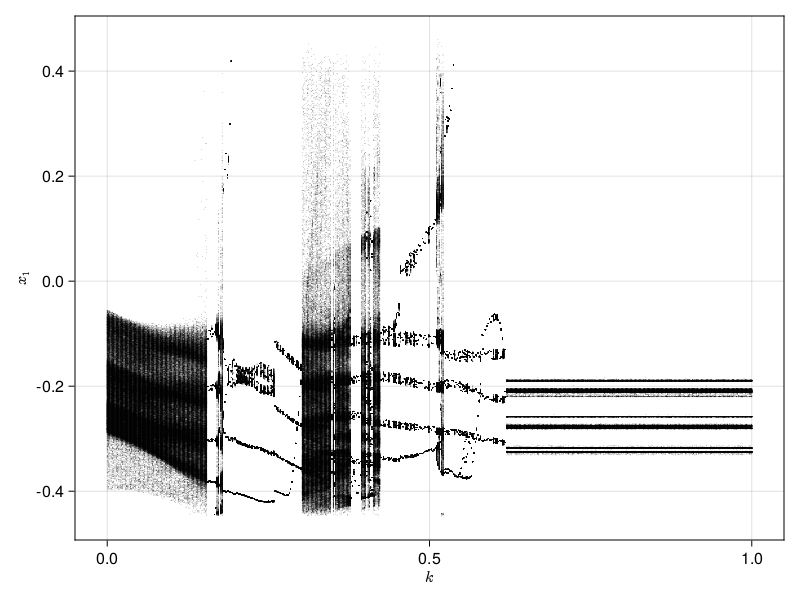

In [19]:
fig = Figure()
ax = Axis(fig[1,1]; xlabel = L"k", ylabel = L"x_1")
for (j, p) in enumerate(pvalues)
    scatter!(ax, fill(p, length(output[j])), output[j];
        color = ("black", 0.5), markersize = 0.7
    )
end
fig